# Coursework #2 AI for Sustainable Development

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import geojson
import optuna
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Ridge
from copy import deepcopy
from sklearn.preprocessing import PowerTransformer
from sklearn import tree
import graphviz
from xgboost import to_graphviz
from IPython.display import Image
import warnings

warnings.filterwarnings('ignore')
random_state = 42

## Previous work (5%)

### **Dataset**

**Dataset description**

The chosen dataset comes from the ["Womxn in Big Data South Africa: Female-Headed Households in South Africa"](https://zindi.africa/competitions/womxn-in-big-data-south-africa-female-headed-households-in-south-africa) challenge from the Zindi platform. The dataset has been developed using the data from the 2011 census in South Africa by aggregating different key indicators that are relevant in the context of the proposed task and that intuitively should have some connections - e.g. home type, school attendance, access to piped water, language. Since South Africa comprises over 4 thousand wards (i.e. geopolitical subdivisions of the country), each feature in the dataset represent ward level information, such as the prevalence of different types of dwellings in a certain ward, the prevalence of different population groups in a certain ward, or the prevalence of women-headed households with an annual income lower than $2.3K in a specific ward.



**Dataset columns descriptions (given in the [Zindi competition](https://zindi.africa/competitions/womxn-in-big-data-south-africa-female-headed-households-in-south-africa))**

| Column     | Description                                                                                                                                 |
|:-----------|:--------------------------------------------------------------------------------------------------------------------------------------------|
| dw_00      | Percentage of dwellings of type: House or brick/concrete block structure on a separate stand or yard or on a farm                           |
| dw_01      | Percentage of dwellings of type: Traditional dwelling/hut/structure made of traditional materials                                           |
| dw_02      | Percentage of dwellings of type: Flat or apartment in a block of flats                                                                      |
| dw_03      | Percentage of dwellings of type: Cluster house in complex                                                                                   |
| dw_04      | Percentage of dwellings of type: Townhouse (semi-detached house in a complex)                                                               |
| dw_05      | Percentage of dwellings of type: Semi-detached house                                                                                        |
| dw_06      | Percentage of dwellings of type: House/flat/room in backyard                                                                                |
| dw_07      | Percentage of dwellings of type: Informal dwelling (shack in backyard)                                                                      |
| dw_08      | Percentage of dwellings of type: Informal dwelling (shack not in backyard e.g. in an informal/squatter settlement or on a farm)             |
| dw_09      | Percentage of dwellings of type: Room/flatlet on a property or larger dwelling/servants quarters/granny flat                                |
| dw_10      | Percentage of dwellings of type: Caravan/tent                                                                                               |
| dw_11      | Percentage of dwellings of type: Other                                                                                                      |
| dw_12      | Percentage of dwellings of type: Unspecified                                                                                                |
| dw_13      | Percentage of dwellings of type: Not applicable                                                                                             |
| psa_00     | Percentage listing present school attendance as:  Yes                                                                                       |
| psa_01     | Percentage listing present school attendance as:  No                                                                                        |
| psa_02     | Percentage listing present school attendance as:  Do not know                                                                               |
| psa_03     | Percentage listing present school attendance as:  Unspecified                                                                               |
| psa_04     | Percentage listing present school attendance as:  Not applicable                                                                            |
| stv_00     | Percentage of households with Satellite TV:  Yes                                                                                            |
| stv_01     | Percentage of households with Satellite TV:  No                                                                                             |
| car_00     | Percentage of households with a car:  Yes                                                                                                   |
| car_01     | Percentage of households with a car:  No                                                                                                    |
| lln_00     | Percentage listing landline ownership as:  Yes                                                                                              |
| lln_01     | Percentage listing landline ownership as:  No                                                                                               |
| lan_00     | Percentage listing language as:  Afrikaans                                                                                                  |
| lan_01     | Percentage listing language as:  English                                                                                                    |
| lan_02     | Percentage listing language as:  IsiNdebele                                                                                                 |
| lan_03     | Percentage listing language as:  IsiXhosa                                                                                                   |
| lan_04     | Percentage listing language as:  IsiZulu                                                                                                    |
| lan_05     | Percentage listing language as:  Sepedi                                                                                                     |
| lan_06     | Percentage listing language as:  Sesotho                                                                                                    |
| lan_07     | Percentage listing language as:  Setswana                                                                                                   |
| lan_08     | Percentage listing language as:  Sign language                                                                                              |
| lan_09     | Percentage listing language as:  SiSwati                                                                                                    |
| lan_10     | Percentage listing language as:  Tshivenda                                                                                                  |
| lan_11     | Percentage listing language as:  Xitsonga                                                                                                   |
| lan_12     | Percentage listing language as:  Other                                                                                                      |
| lan_13     | Percentage listing language as:  Unspecified                                                                                                |
| lan_14     | Percentage listing language as:  Not applicable                                                                                             |
| pg_00      | Percentage in population group:  Black African                                                                                              |
| pg_01      | Percentage in population group:  Coloured                                                                                                   |
| pg_02      | Percentage in population group:  Indian or Asian                                                                                            |
| pg_03      | Percentage in population group:  White                                                                                                      |
| pg_04      | Percentage in population group:  Other                                                                                                      |
| lgt_00     | Percentage using electricity for lighting                                                                                                   |
| pw_00      | Percentage with piped water access:  Piped (tap) water inside dwelling/institution                                                          |
| pw_01      | Percentage with piped water access:  Piped (tap) water inside yard                                                                          |
| pw_02      | Percentage with piped water access:  Piped (tap) water on community stand: distance less than 200m from dwelling/institution                |
| pw_03      | Percentage with piped water access:  Piped (tap) water on community stand: distance between 200m and 500m from dwelling/institution         |
| pw_04      | Percentage with piped water access:  Piped (tap) water on community stand: distance between 500m and 1000m (1km) from dwelling /institution |
| pw_05      | Percentage with piped water access:  Piped (tap) water on community stand: distance greater than 1000m (1km) from dwelling/institution      |
| pw_06      | Percentage with piped water access:  No access to piped (tap) water                                                                         |
| pw_07      | Percentage with piped water access:  Unspecified                                                                                            |
| pw_08      | Percentage with piped water access:  Not applicable                                                                                         |
| ADM4_PCODE | Code for linking row to ward in the wards shapefile                                                                                         |
| lat        | Lattitude of the center point of the ward                                                                                                   |
| lon        | Longitude of the center point of the ward                                                                                                   |
| NL         | Nightlights value for the area around (lat, lon)                                                                                            |
| target     | Percentage of women head households with income under R19.6k out of total number of households                                              |

**Why this dataset is relevant in the context of Sustainable Development**

The relevance of this dataset in the context of the 17 Sustainable Development Goals come from the key indicators it contains. By the very nature of the data collection process - i.e. through a census -, the dataset is focused on capturing South Africa's life standards, and societal aspects across all its geopolitical subspaces. The indicators in this dataset capture a wide scope of zone characteristics, ranging from assesing the fulfillment of core needs, and assets which some citizens lack - such as proper shelter, or easy acces to piped water -, to the prevalence of non-basic possessions, like cars or satellite television. The presence of such a wide spectrum of features that capture multiple aspects of the South African society is what makes this dataset establish connections to multiple Sustainable Goals. The study of different types of access to piped water access is aligned to the sixth SDG ("Clean water and sanitation"), and the examination of school attendance data is related to the fourth SDG ("Quality education"). Accounting the prevalence of women-headed households that have an income that is lower than a basic standard in South Africa addresses both the first ("No poverty") and the fifth ("Gender equality") SDGs. Furthermore, when looking at the bigger picture, the dataset contains certain indicators that quantify the prevalence of certain "privileged" goods, such as satellite TV or cars, while at the same time revealing the presence of certain gaps in basic needs for people that live in the same region. This dualism of life standards that is brought to light also relates this dataset to the tenth SDG ("Reduce inequality"). Thusly, by putting together all these indicators that are conected to different SDGs, the dataset is not only relevant in the contenxt of Sustainable Development, but it also captures the complexity of this field and the interconnection between the SDGs.

### **Previous work**

As the dataset contains numerical data, it can be primarily used in regression tasks, as it was used in the context of the Zindi competition which the dataset was downloaded from. Since the competition is closed, some approaches to solving this problem have been previously tried. Firstly, on the challange's page, along with the data, [a starter notebook](https://zindi.africa/competitions/womxn-in-big-data-south-africa-female-headed-households-in-south-africa/data) has been posted to help the participants in the competition. This notebook contains a few classical data analyses (such as correlation between some features, target histplot), and two baselines - i.e. a Linear Regression model and a Random Forest model - which were meant to give hints to the participants. Furthermore, some competitors with good results shared some insights into their approaches, which mainly focused on the model stacking paradigm. While some competitors' notebooks have been made available after the competition (links to two notebooks are present in this [page](https://zindi.africa/learn/meet-the-winners-of-the-womxn-in-big-data-south-africa-female-headed-households-in-south-africa-challenge)), there is not necessarily a publicly available model that one can import and use as is. As this datset was used as part of a competition, the available approaches are more focused on implementing the solution that could get the best results, rather than performing comprehensive data analysis, describing the thought process of certain choices or assessing certain Sustainable Development concerns, which this coursework hopefully does. Since there is a limited set of approaches for solving regression tasks, this coursework will be focused on trying to achieve the best results using less computationally intensive approaches than model stacking, because, as we know, the computational intensity of a model is directly proportional to the negative impact it has on the environment. Additionally, this coursework will also focus on exploring the interpretability of the different proposed models. In the context of this dataset which encapsulates different connections between SDGs, and the applicability of a model in Sustainable Development, interpretability can play an important role in the success of such a solution, as it helps reveal different patterns which give hints to key decission makers about possible solutions to these problems.

## Exploratory data analysis (15%)

As mentioned before, because this dataset has been previously used in a competition which was more focused on getting the best results, rather than documenting the thought process, the contestants have not really done an Empirical Data Analysis to explain certain steps in their solutions. Thus, the "novelty" of this current approach begins by doing a more in depth data analysis to motivate further decisions in the data preprocessing and modelling process. The insights on the following analyses will be revealed step by step.

### **What are the characteristics of your dataset? Do you see any trends in the data? (5%)**

In this section the main analysed trend is in the location, more specifically the correlation between locations of the datapoints and their target values. Nonetheless, in the following sections, as the analysis flows, certain identified trends and charasteristics of the dataset will be discussed. The split into the 3 indicated parts of this section has been made to try and follow the suggested structure, but in the context of Exploratory Data Analysis, each step can reveal new characteristics and trends of the dataset.

**Load dataset**

In [3]:
df = pd.read_csv('./Female_headed_households/data.csv')
target_column = 'target'
feature_columns = [col for col in df.columns 
                   if col != 'target' and col != 'ward' and col != 'ADM4_PCODE']
df

,ward,total_households,total_individuals,target,dw_00,dw_01,dw_02,dw_03,dw_04,dw_05,...,pw_03,pw_04,pw_05,pw_06,pw_07,pw_08,ADM4_PCODE,lat,lon,NL
0,41601001: Ward 1,1674.45058,5888.20750,16.773757,0.933841,0.000846,0.005490,0.000676,0.000000,0.001372,...,0.002848,0.007537,0.000000,0.012928,0,0,ZA4161001,-29.682270,24.734743,0.292039
1,41601002: Ward 2,1736.99230,6735.33812,21.496661,0.696940,0.001253,0.004402,0.000000,0.002301,0.001323,...,0.014566,0.057127,0.019092,0.004131,0,0,ZA4161002,-29.119311,24.757737,3.207775
2,41601003: Ward 3,2403.57591,7273.04995,10.931425,0.810545,0.004517,0.008891,0.003986,0.007735,0.000956,...,0.057560,0.010358,0.001421,0.040881,0,0,ZA4161003,-29.142276,25.094093,0.000000
3,41601004: Ward 4,1740.78737,5734.49046,23.119257,0.659914,0.000000,0.006129,0.000000,0.000813,0.037245,...,0.000000,0.000669,0.000000,0.005011,0,0,ZA4161004,-29.372052,24.942867,2.038778
4,41601005: Ward 5,1730.51451,6657.23835,13.652252,0.950575,0.000655,0.001473,0.000598,0.006999,0.000818,...,0.004859,0.001290,0.000673,0.017629,0,0,ZA4161005,-29.409381,25.290165,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2817,34503001: Ward 1,3261.68067,11551.56486,6.393480,0.874972,0.003146,0.017230,0.004735,0.048888,0.000654,...,0.000472,0.000472,0.000000,0.006203,0,0,ZA3453001,-27.675590,23.057920,9.118927
2818,34503002: Ward 2,1463.06432,7908.90411,15.668000,0.636235,0.002262,0.010433,0.000000,0.003030,0.000000,...,0.003030,0.000713,0.000000,0.008414,0,0,ZA3453002,-27.591408,22.907161,1.697395
2819,34503003: Ward 3,1395.18881,6242.37527,13.238795,0.855975,0.006601,0.061118,0.000812,0.003912,0.000812,...,0.002150,0.001458,0.000000,0.003670,0,0,ZA3453003,-27.952550,22.749698,2.792501
2820,34503004: Ward 4,1679.66964,8014.73089,17.639523,0.792552,0.004423,0.016099,0.000000,0.000674,0.000000,...,0.009235,0.007870,0.000000,0.004803,0,0,ZA3453004,-27.913875,22.755314,2.793699


As can be observed from the previous preview, the dataset is mostly numerical. The only categorical feature is ADM4_CODE, which is unique for each feature, and can be used to extract additional data for each ward. As this dataset already has a large number of features, additional information was not added, so the column will further be dropped.

**Show dataset entries on map**

Since the dataset provides the latitude and longitude for each ward, a visualization of the spread of the data points in South Africa could reveal some patterns. The following code cell prints the map of South Africa and plots points for each ward centroid described by the latitude and longitude features. As can be observed, the points on the map have different colours, as they have been colour-coded based on the target value in the dataset. More explicitly, if the target value is lower than the 25th percentile of the target, the point will be plotted in green. If the target value is between the 25th and the 50th percentile, the point is blue. If the target is between the 50th and the 75th percentile, the point is orange. Finally, if the target value is greater than the 75th percentile, the point is plotted in red. The idea of colour coding the points based on their targets came as a way to try and understand if any locational relationships between different data points and their target values exist.

Additionally, since the authors also provided their own test dataset, the locations of those points have been plotted in black on the map. Since this dataset was used in a competition, the target values for the test set are not revealed. Because this coursework is focused on assessing the performance of different supervised learning methods to solve the task, the author's test split will not be used in the experiments. Instead, the training data provided will be split into training and testing sets to be able to assess the performance of the implemented models. The author's test split has been plotted more out of curiosity to see the spread of the data points.

**Insights:** As can be observed in the map below, the data points with the largest target values (red and orange dots) tend to be clustered around the eastern side of the South African shore and the far northeastern side of the country. On the other hand, the data points which have the smallest target values (blue and green dots) tend to be clustered around the city of Johannesburg in South Africa, with some points also present along the shore. Thus, this map indicates that the latitude and longitude can be relevant features in the dataset which, when combined, can have a correlation to the target and have the potential to help models in their predictions.

**Note:** After implementing the visualization, it has been observed that the interactive map displayed in the notebook using the folium package is not exported properly in a PDF format. Thus, a screenshot has been taken of the map and is displayed in a different code cell.


In [4]:
# Get centre of map
locations = list(zip(df.lat, df.lon, df.target))
average_lat = sum(lat for lat, lon, target in locations) / len(locations)
average_lon = sum(lon for lat, lon, target in locations) / len(locations)

# Target quantiles
target_quantiles = [df['target'].quantile(0.25), 
                    df['target'].quantile(0.5), 
                    df['target'].quantile(0.75)]

# Add map
mymap = folium.Map(location=[average_lat, average_lon], zoom_start=6)

# Add markers for each location
for lat, lon, target in locations:
    if target < target_quantiles[0]:
        folium.CircleMarker(location=[lat, lon], radius=0.5, 
                            color='green', opacity=.6).add_to(mymap)
    elif target< target_quantiles[1]:
        folium.CircleMarker(location=[lat, lon], radius=0.5,
                             color='blue', opacity=.6).add_to(mymap)
    elif target < target_quantiles[2]:
        folium.CircleMarker(location=[lat, lon], radius=0.5, 
                            color='orange', opacity=.6).add_to(mymap)
    else:
        folium.CircleMarker(location=[lat, lon], radius=0.5, 
                            color='red', opacity=.6).add_to(mymap)

# Get test locations
test_df = pd.read_csv('./Female_headed_households/Test.csv')
test_locations = list(zip(test_df.lat, test_df.lon))
# Plot test locations
for lat, lon in test_locations:
    folium.CircleMarker(location=[lat, lon], 
                        radius=0.3, 
                        opacity=.7, 
                        color='black').add_to(mymap)

# Get South Africa geometry
with open('./Female_headed_households/countries.geojson') as f:
    gj = geojson.load(f)
south_africa_geometry = next(x for x in gj['features'] 
                             if x['properties']['ISO_A3'] == 'ZAF')

# Add South Africa delimitation
folium.GeoJson(south_africa_geometry, style_function=lambda feature: {
        "fillColor": "#ffff00",
        "color": "black",
        "weight": 1.5}).add_to(mymap)

mymap

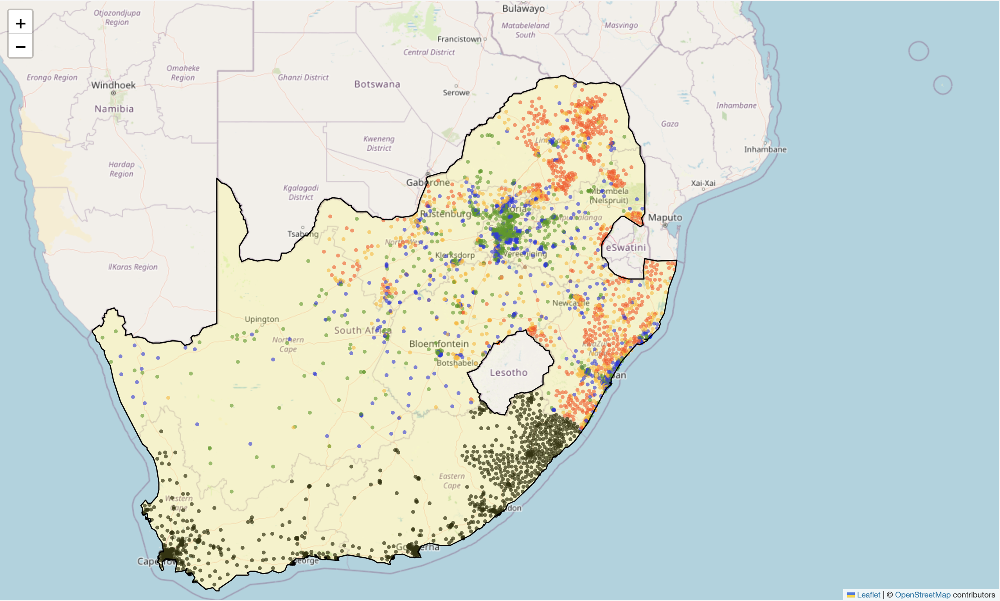

In [5]:
Image(filename = "./folium_map.png", width=1000)

### **Are there any challenges with the data? (missing values, outliers, imbalanced classes, biases, etc...) (5%)**

**Check for missing values in dataset**

As can be observed in the code cell below, the dataset does not contain any missing values.

In [6]:
df.isna().sum().sum()

0

**Check features distristibutions and outliers** (display histplots and boxplots for all features, including the target)

While analyzing the histograms and the box plots for each feature in a high-dimensional dataset like this one can seem overwhelming, these plots are the most intuitive way of understanding the dataset. Firstly, the histograms reveal the distribution of each feature, which gives insights into the data preprocessing that needs to be done in order to apply certain models. Secondly, the box plots visually reveal the presence of outliers in the dataset, and their prevalence in different features.

*Insights revealed through this analysis*

Firstly, as can be observed in the last pair of plots for the target variable, the feature follows a somewhat normal distribution. Secondly, most of the other features have either negatively or positively skewed distributions and overall contain a lot of outliers. However, the dataset also contains some features that do not display classical patterns in their distributions, such as lan_04, lat, and long features. Lastly, this analysis also revealed the presence of some features that do not have any variance, making them irrelevant to a regression task and indicating that they can be dropped since they do not contain additional information.

Overall, given that the dataset is composed of many features that follow various distributions, this analysis reveals that data standardization could positively influence the quality of prediction of models such as Ridge Regression. Furthermore, this analysis revealed the presence of many outliers in almost all of the predictive features, which can mislead the training process. Given the reduced size of this dataset - i.e. it contains 2822 entries -, the removal of outliers from all features can harm the predictive capabilities of the implemented models by significantly decreasing the size of the dataset. Moreover, given that the data comes from a national census in South Africa, some data points, which can be regarded as outliers from a technical point of view, capture the diversity of the South African wards. Thus, dropping a lot of data points that are regarded as outliers from a technical point of view can add dataset bias in the modelling process, more explicitly selection bias, which can appear when removing certain samples in a non-random way [1].

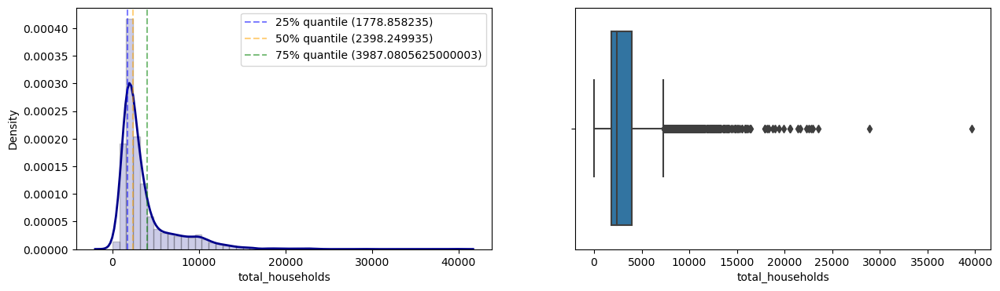

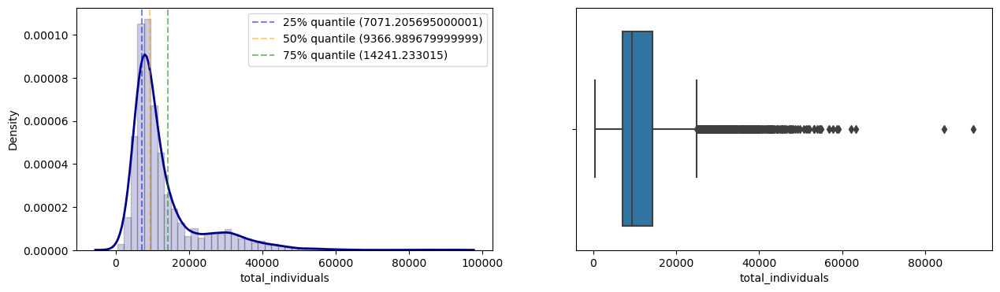

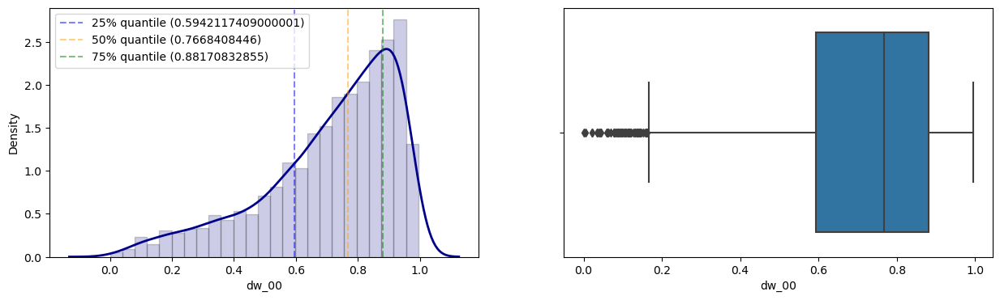

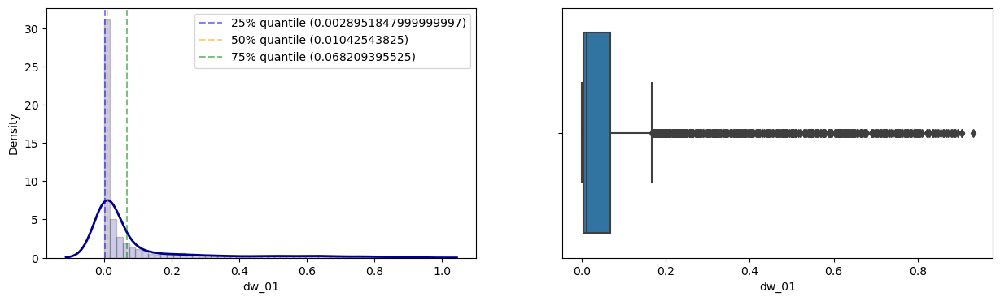

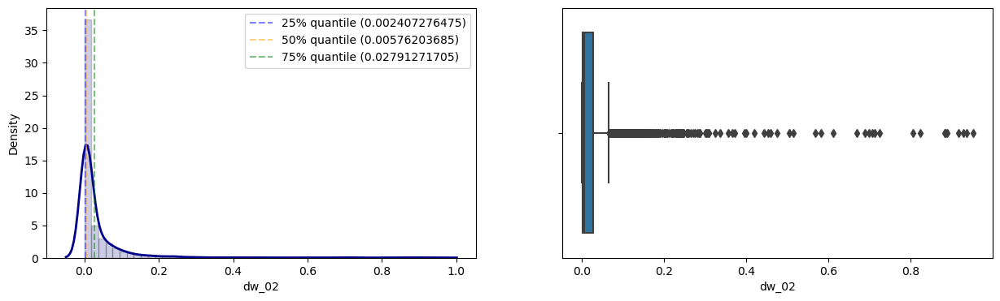

...

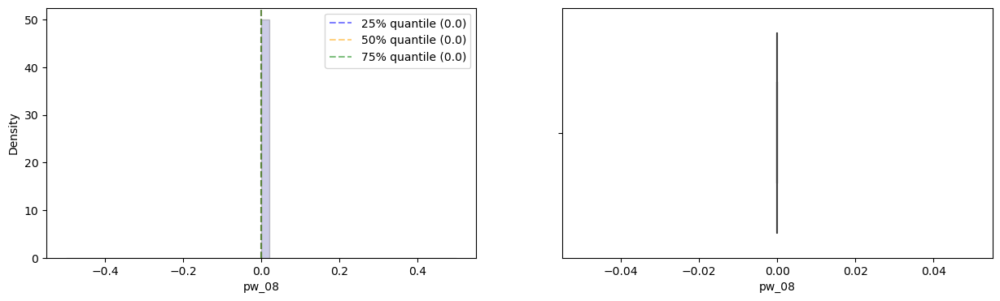

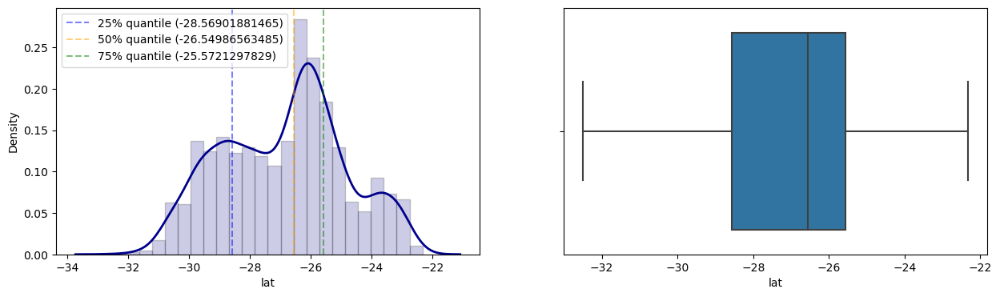

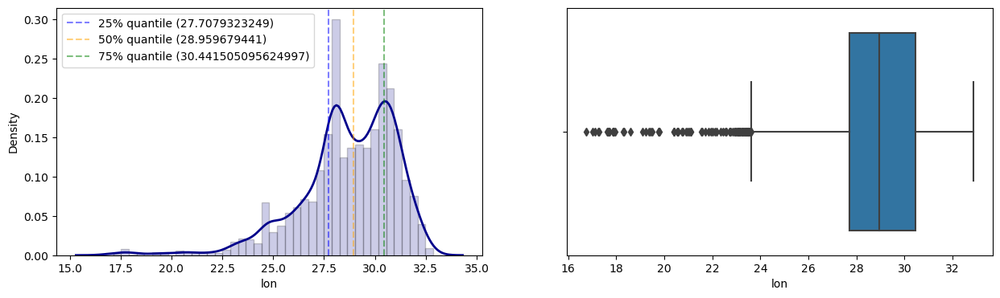

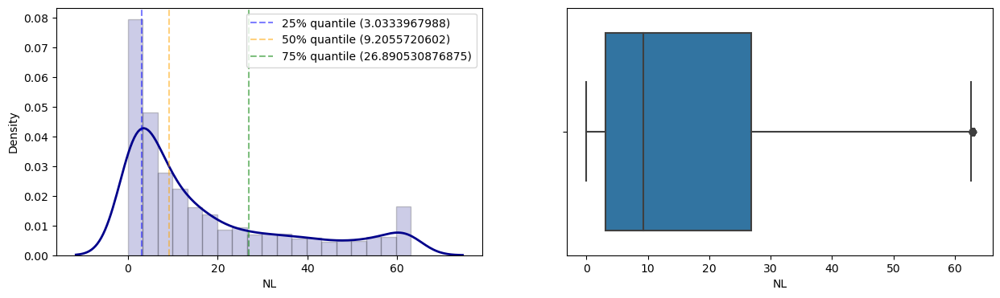

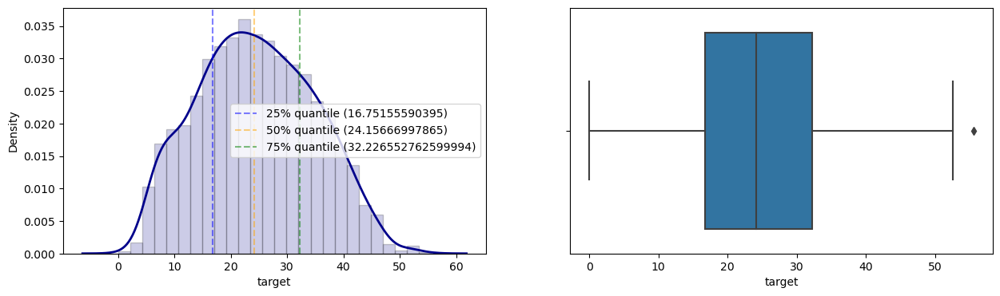

In [7]:
for f in feature_columns + [target_column]:
    fig, ax =plt.subplots(1, 2, figsize=(15, 4))
    plot = sns.distplot(df[f], hist=True,
                        color = 'darkblue',
                        hist_kws={'edgecolor':'black', 'alpha':0.2},
                        kde_kws={'linewidth': 2},
                        ax=ax[0])
    plot.axvline(df[f].quantile(0.25), ls='--', color='blue', alpha=0.5, 
                 label='25% quantile (' + str(df[f].quantile(0.25)) + ')')
    plot.axvline(df[f].quantile(0.5), ls='--', color='orange', alpha=0.5, 
                 label='50% quantile (' + str(df[f].quantile(0.5)) + ')')
    plot.axvline(df[f].quantile(0.75), ls='--', color='green', alpha=0.5, 
                 label='75% quantile (' + str(df[f].quantile(0.75)) + ')')
    plot.set_xlabel(f)
    plot.legend(loc='best')

    sns.boxplot(x=df[f], ax=ax[1])
    plt.show()

**Identify columns with no variance**

As the previous analysis revealed, there are some columns with no variance. The following code cell identifies these columns, as they will be dropped in the data preprocessing phase.

In [8]:
features_variaces = df[feature_columns].var(axis='index')
features_w_no_variance = []
for feature, variance in features_variaces.items():
    if variance == 0:
        features_w_no_variance.append(feature)
features_of_interest = [col for col in feature_columns 
                        if col not in features_w_no_variance]
features_w_no_variance

['dw_12', 'dw_13', 'lan_13', 'pw_07', 'pw_08']

**Plot correlation matrix to look for extremely correlated features**

The correlation matrix provides a comprehensive visualization of the correlations between all the features in the dataset. In the following plot, annotations with the values for each correlation have been added to better evaluate the relationships between features, as colour coding can sometimes be misleading.

*Insights revealed through the analysis*

This analysis revealed that there are three pairs of features that display perfect negative correlation - i.e. (stv_00, stv_01), (car_00, car_01), and (lln_00, lln_01). This perfect negative correlation is determined by the fact that in each pair, one term can be determined from the other term through the following formulas: stv_00 = 1 - stv_01, car_00 = 1 - car_01, lln_00 = 1 - lln_01. This comes as no surprise when reading the feature descriptions of these variables, but the correlation matrix provides concrete evidence. Furthermore, the high correlation between the total_households and total_individuals features displayed in the matrix could indicate that by dropping one of these columns, no relevant information will be lost, from the perspective of the predictive model. Another high correlation can be observed for the psa_00 and psa_01 features, which indicates that most people included in the census responded with either "Yes" or "No" to the present school attendance question, and that a significantly lower number of people responded with the other available answers - i.e. "Do not know", "Unspecified", or "Not applicable". Similar to the previous example, the high correlation between these features indicate that by dropping one of these features, no relevant information should be lost, since they represent more or less duplicate information. Lastly, other high correlations, both negative and positive, can be observed between features from any of the aforementioned pairs - i.e. (stv_00, stv_01), (car_00, car_01), and (lln_00, lln_01). These correlations reveal some interesting patterns in the data. More explicitly, the bigger the percentage of people that own cars in a ward, the bigger the percentage of people that have satellite TV, or a landline. Analysing this in context, these correlation disclose that most of the time these assets are owned at the same time, which in perspective can be simply interpreted as follows: if a household affords to have a car, it can also afford satellite TV and a landline.

While, as mentioned before, these correlations can reveal the presence of duplicated information in the dataset, in some cases the removal of such "duplicated" features can negatively impact a model's performance. Empirical data analysis is an iterative process. Data analysis reveals some patterns which help formulate different hypotheses regarding data preprocessing, but these hypotheses are tested on baselines to decide whether a certain preprocessing step helps or not. Thus, it is important to mention that the previous insights have been taken into consideration in the preprocessing step, and have been tested on the main proposed model, but not all of them have helped the model perform better.

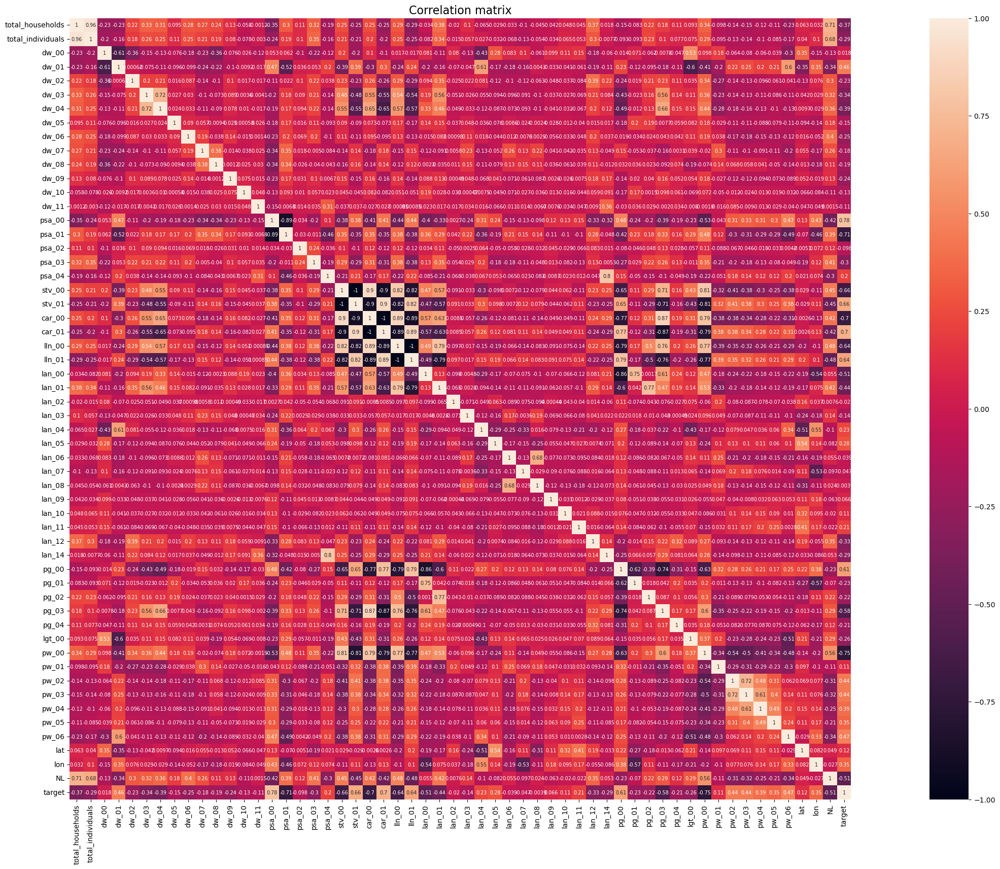

In [9]:
# Plot correlation matrix
def plot_corr_matrix(df, features):
    correlation = df[features].corr()
    f , ax = plt.subplots(figsize = (40,20))
    plt.title('Correlation matrix', y=1, size=16)
    sns.heatmap(correlation, square = True, 
                annot=True, annot_kws={"fontsize":7})
    plt.show()

plot_corr_matrix(df, features_of_interest + [target_column])

### **Does the data need any pre-processing to successfully apply standard machine learning models? If so, what kind? Please do the pre-processing that you consider necessary. (5%)**

The data does not necessarily need any preprocessing to apply standard machine learning models, other than dropping the identification column - "ward" feature in this case -, and the "ADM4_CODE" which cannot be used directly and which can also be seen as an identification column. But, as the previous analyses revealed, some preprocessing could help the performance of the models that will be implemented later. This section will focus on dimensionality reduction, some feature creation which proved useful, and data standardization.

### Dimensionality reduction

**Drop identification columns**

In [10]:
# Drop ward column
df.drop(columns=['ward'], inplace=True)
# Drop ADM4_PCODE column
df.drop(columns=['ADM4_PCODE'], inplace=True)
# Recompute the feature columns
feature_columns = [col for col in df.columns 
                   if col != 'target' and col != 'ward' and col != 'ADM4_PCODE']

**Drop irrelevant columns (columns with no variance)**

As mentioned before, these columns do not add any new information in the training process

In [11]:
# Drop features with no variance
df.drop(columns=features_w_no_variance, inplace=True)
feature_columns = [col for col in feature_columns 
                   if col not in features_w_no_variance]

**Drop one element from each perfect negative correlation pair**

Similar to the previous case, by dropping one of the feature in each pair, no relevant information will be lost since it is encapsulated in the paired feature. Thus, for the (stv_00, stv_01) pair stv_00 has been kept, for the (car_00, car_01) pair car_00 ahs been kept, and for the (lln_00, lln_01) pair, lln_00 has been kept.

In [12]:
df.drop(columns=['stv_01', 'car_01', 'lln_01'], inplace=True)
feature_columns = [col for col in feature_columns 
                   if col not in ['stv_01', 'car_01', 'lln_01']]

**Feature creation**

As this dataset contains many features that can conceptually be correlated, it allows for some creativity in the form of feature creation. Thus, starting from the feature descriptions presented earlier, some new features are computed in this part that proved beneficial for the assessed models. 

Firstly, a new feature can be computed from the total_individuals and total_households features, more specifically a feature that contains the average number of individuals in a household in a ward. Because of the previously highlighted strong correlation between the total_individuals and total_households features, after computing the new feature, the total_individuals feature has been dropped. By "replacing" the total_individuals feature with the newly computed feature, the performance of the solution has been improved. 

Secondly, given the similarities between the pw_02, pw_03, pw_04, and pw_05 features - i.e. all reveal percentages of households that only have access to piped water on community stands, with the distance to the closest stand varying for each feature - the idea of combining them into a single feature made sense. When using this newly created feature and dropping the features it was based on, the performance of the solution increased. 

Another idea for a new feature emerged from the conceptual link between the NL and lgt_00 features, where NL indicates the nightlight value for the area around and lgt_00 represents the percentage of households in a ward using electricity for lighting. Naturally, the number of nightlights in an area should correlate with the electricity usage in the households in that area. This link has been encapsulated in a new feature that computes the ratio between the NL and lgt_00 features, and that increases the solution's performance. 

Lastly, similar to the previous example, a conceptual link can be made between the lgt_00 and psa_00, and dw_10 and psa_00 features, where psa_00 represents the percentage of people in a ward that are currently attending school, and dw_10 represents the percentage of dwellings of type caravan or tent. The reason behind linking these features is the following: both the lack of electric lighting and an adequate type of home can have a negative impact on student performance, which can influence the student's school attendance. Similarly, by adding these new features to the dataset, the performance of the solution increased.

After adding this features, similar to the previous approach, the histograms and box plots for each feature have been plotted. Additionally, two problematic outliers emerged from these features. If the outliers appear in the training set, they are removed. If they appear in the testing set they are not dropped, since this can be perceived as data leakage between the training and testing set.

In [13]:
df['avg_individuals_per_household'] = df['total_individuals'] / df['total_households']
df.drop(columns=['total_individuals'], inplace=True)

df['pw_community_source'] = df['pw_02'] + df['pw_03'] + df['pw_04'] + df['pw_05']
df.drop(columns=['pw_02', 'pw_03', 'pw_04', 'pw_05'], inplace=True)

df['NL_to_lgt_ratio'] = df['NL'] / df['lgt_00']
df['lgt_to_sa_ratio'] = df['lgt_00'] / df['psa_00']
df['inadequate_dw_to_sa_ratio'] = df['dw_10'] / df['psa_00']

additional_features = ['avg_individuals_per_household', 'pw_community_source', 
                       'NL_to_lgt_ratio', 'lgt_to_sa_ratio', 
                       'inadequate_dw_to_sa_ratio']

Investigating some outliers in the added features and plot their distributions

In [14]:
two_greatest_values = list(df['avg_individuals_per_household']
                           .sort_values().iloc[-2:])
print('The two greatest values in avg_individuals_per_household are %s.' 
      % (str(two_greatest_values)))
out_index = list(df.loc[df['avg_individuals_per_household'] > 100].index)[0]
print("The extreme outlier for the avg_individuals_per_household feature (the biggest value for this column) is at index %d.\n" % (out_index))

two_greatest_values = list(df['NL_to_lgt_ratio'].sort_values().iloc[-2:])
print('The two greatest values in NL_to_lgt_ratio are %s.' 
      % (str(two_greatest_values)))
out_index = list(df.loc[df['NL_to_lgt_ratio'] > 300].index)[0]
print('The extreme outlier for the NL_to_lgt_ratio feature is at index %d.\n' 
      % (out_index))

two_greatest_values = list(df['lgt_to_sa_ratio'].sort_values().iloc[-2:])
print('The two greatest values in lgt_to_sa_ratio are %s.' 
      % (str(two_greatest_values)))
out_index = list(df.loc[df['lgt_to_sa_ratio'] == np.inf].index)[0]
print('The extreme outlier for the lgt_to_sa_ratio feature is at index %d.\n' 
      % (out_index))

two_greatest_values = list(df['inadequate_dw_to_sa_ratio'].sort_values().iloc[-2:])
print('The two greatest values in inadequate_dw_to_sa_ratio are %s.' 
      % (str(two_greatest_values)))
out_index = list(df.loc[np.isnan(df['inadequate_dw_to_sa_ratio'])].index)[0]
print('The extreme outlier for the inadequate_dw_to_sa_ratio feature is at index %d.' % (out_index))

The two greatest values in avg_individuals_per_household are [8.660609372381776, 3867.0].
The extreme outlier for the avg_individuals_per_household feature (the biggest value for this column) is at index 1815.

The two greatest values in NL_to_lgt_ratio are [281.8278750512911, 26379.112821785548].
The extreme outlier for the NL_to_lgt_ratio feature is at index 2400.

The two greatest values in lgt_to_sa_ratio are [13.024999665051928, inf].
The extreme outlier for the lgt_to_sa_ratio feature is at index 1815.

The two greatest values in inadequate_dw_to_sa_ratio are [0.21478419254178907, nan].
The extreme outlier for the inadequate_dw_to_sa_ratio feature is at index 1815.


In [15]:
outlier_indexes = [1815, 2400]

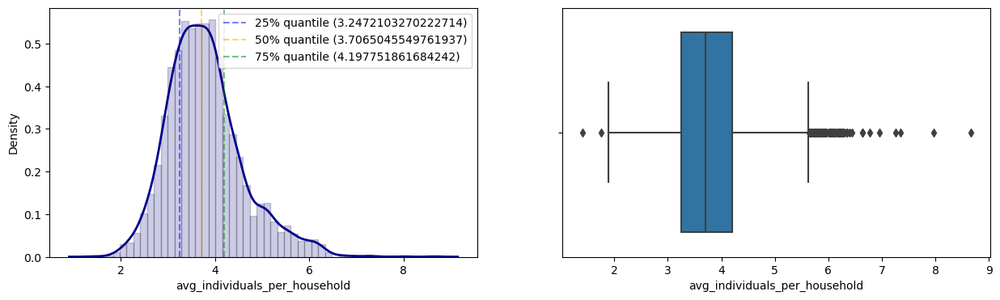

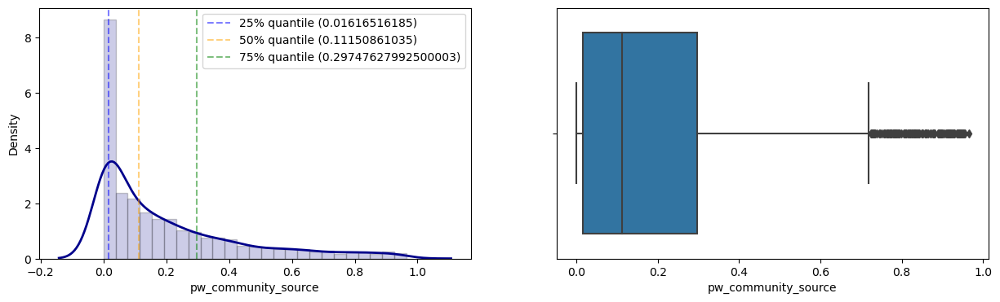

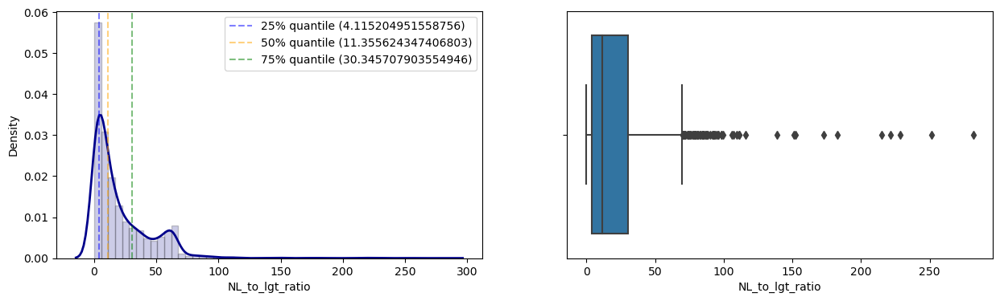

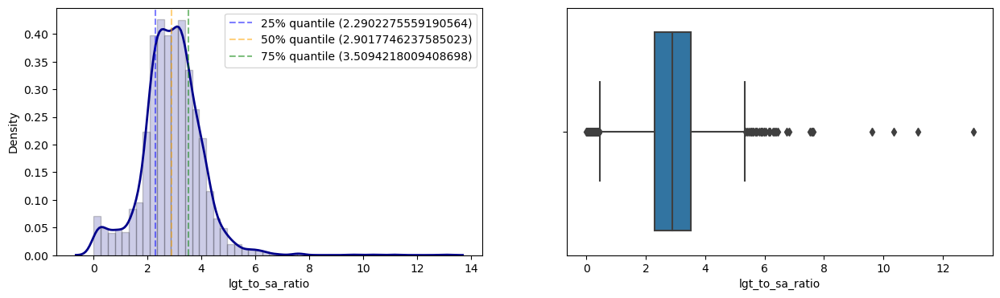

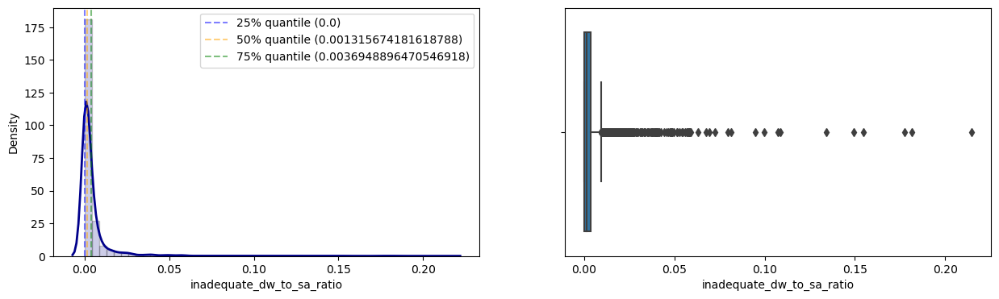

In [16]:
for f in additional_features:
    feature_data = df[f]
    feature_data.drop(index=outlier_indexes, inplace=True)
    
    fig, ax =plt.subplots(1, 2, figsize=(15, 4))
    plot = sns.distplot(feature_data, hist=True,
                        color = 'darkblue',
                        hist_kws={'edgecolor':'black', 'alpha':0.2},
                        kde_kws={'linewidth': 2},
                        ax=ax[0])
    plot.axvline(feature_data.quantile(0.25), ls='--', color='blue', alpha=0.5, 
                 label='25% quantile (' + str(feature_data.quantile(0.25)) +')')
    plot.axvline(feature_data.quantile(0.5), ls='--', color='orange', alpha=0.5, 
                 label='50% quantile (' + str(feature_data.quantile(0.5)) +')')
    plot.axvline(feature_data.quantile(0.75), ls='--', color='green', alpha=0.5, 
                 label='75% quantile (' + str(feature_data.quantile(0.75)) +')')
    plot.set_xlabel(f)
    plot.legend(loc='best')

    sns.boxplot(x=feature_data, ax=ax[1])
    plt.show()

**Data standardization**

The final step in data preprocessing is data standardization. Prior to doing data standardization, the dataset has been split to avoid data leakage between the training and testing split. More explicitly, the data transformers are fitted on the training data, and then applied on the test data. All features have been transformed using the Yeo-Johnson transformation, because it can transform skewed distributions such that they look more normally distributed [2], and it can also handle values that are equal to 0 (as opposed to the Box-Cox transofrmation), which are present in this dataset. After the transformation, the features have been standardized. Both the raw and standardized data have been kept, since the raw nature of data will be considered a hyperparameter in the next sections.

Split data

In [18]:
def split_data(df):
    X = df[[col for col in df.columns if col != target_column]]
    y = df[target_column]
    X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                        test_size=0.2, 
                                                        random_state=random_state, 
                                                        shuffle=True)
    return X_train, X_test, y_train, y_test

X_train_full, X_test, y_train_full, y_test = split_data(df)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, 
                                                  test_size=0.2, 
                                                  random_state=random_state, 
                                                  shuffle=True)

Remove outliers if they are in the training set

In [19]:
for outlier in outlier_indexes:
    if outlier in X_train_full.index:
        X_train_full.drop(index=outlier, inplace=True)
        y_train_full = y_train_full.drop(outlier)
    if outlier in X_train.index:
        X_train.drop(index=outlier, inplace=True)
        y_train = y_train.drop(outlier)
    if outlier in X_val.index:
        X_val.drop(index=outlier, inplace=True)
        y_val = y_val.drop(outlier)

In [37]:
preprocessed_X_train = X_train.copy()
preprocessed_X_test = X_test.copy()
preprocessed_X_val = X_val.copy()
preprocessed_X_train_full = X_train_full.copy()
preprocessed_y_train = y_train.copy()
preprocessed_y_test = y_test.copy()
preprocessed_y_val = y_val.copy()
preprocessed_y_train_full = y_train_full.copy()

features_power_transformers = {feature : PowerTransformer(method='yeo-johnson', standardize=True) for feature in X_train.columns}
features_power_transformers['target'] = PowerTransformer(method='yeo-johnson', standardize=True)

for feature in features_power_transformers.keys():
    pt = features_power_transformers[feature]
    if feature != target_column:
        pt.fit(X_train[feature].to_numpy().reshape(-1, 1))
        preprocessed_X_train[feature] = pt.transform(X_train[feature].to_numpy().reshape(-1, 1))
        preprocessed_X_test[feature] = pt.transform(X_test[feature].to_numpy().reshape(-1, 1))
        preprocessed_X_val[feature] = pt.transform(X_val[feature].to_numpy().reshape(-1, 1))
        preprocessed_X_train_full[feature] = pt.transform(X_train_full[feature].to_numpy().reshape(-1, 1))
    else:
        pt.fit(y_train.to_numpy().reshape(-1, 1))
        preprocessed_y_train = pt.transform(y_train.to_numpy().reshape(-1, 1))
        preprocessed_y_test = pt.transform(y_test.to_numpy().reshape(-1, 1))
        preprocessed_y_val = pt.transform(y_val.to_numpy().reshape(-1, 1))
        preprocessed_y_train_full = pt.transform(y_train_full.to_numpy().reshape(-1, 1))

### Task and evaluation (10%)

The challange associated with this dataset consists of developing a Machine Learning model that using the dataset features can predict the percentage of female-headed households in a ward that have an annual income lower than approximately 2.3 thousand dollars at the time the data was collected (https://zindi.africa/competitions/womxn-in-big-data-south-africa-female-headed-households-in-south-africa). Consequently, the models have to be trained and have their performances compared on regression evaluation metrics. For regression tasks there are a plethora of possible evaluation metrics, but for this task the main ones used are Mean Absolute Error (MAE), Mean Sqaured Error (MSE), and Root Mean Squared Error (RMSE). The Root Mean Squared Error and Mean Squared Error are the main metrics used in the traning process for the models. Additionally, the Mean Absolute Error has been used because of its interpretability to answear some of the questions in the next parts.

$$ MAE = \frac{1}{n}\Sigma_{i=1}^{n}{| y_i - \hat{y_i}|}$$
$$ MSE = \frac{1}{n}\Sigma_{i=1}^{n}{(y_i - \hat{y_i})^2}$$
$$ RMSE = \sqrt{\frac{1}{n}\Sigma_{i=1}^{n}{(y_i - \hat{y_i})^2}}$$

Moreover, because in the Empirical Data Analysis data transformations have been performed on the target value as well, "customized" implementations for RMSE and MAE are needed when using the preprocessed targets in training - i.e. the predicted target value has to be inverse transformed using the target transformer before being compared to the actual targets. These implementations are used in the hyper-parameter tuning section and are used to compare different instances of the same model when trained on raw data, or standardized data.

In [21]:
def rmse(y_test, y_predicted):
    score = np.sqrt(mean_squared_error(y_test, y_predicted))
    return score

In [22]:
def rmse_with_preprocessed_target(y_test, y_predicted):
    actual_predictions = features_power_transformers['target'].inverse_transform(y_predicted.reshape(-1, 1))
    score = np.sqrt(mean_squared_error(y_test, actual_predictions))
    return score

In [23]:
def mean_absolute_error_with_preprocessed_target(y_test, y_predicted):
    actual_predictions = features_power_transformers['target'].inverse_transform(y_predicted.reshape(-1, 1))
    score = mean_absolute_error(y_test, actual_predictions)
    return score

## Design and build an ML system (20%)

**Models Justification**

When attempting to solve any type of problem using Machine Learning methods, the nature of the dataset and the task has a high influence on the type of model that should be used. In this particular case, we are interested in building a regression model that works best on tabular data. While regression problems can be solved in multiple ways, the type and complexity of the dataset used for training such models provide hints about the modelling choices that need to be considered when proposing a solution, narrowing down the list of possible approaches. For example, when faced with a regression task on image data, the obvious first choice that comes to mind is Deep Learning. On the other hand, when dealing with a regression problem like the one proposed on this small-sized tabular dataset, while Deep Learning approaches can still be practically applied, the results might not be as good. Multiple pieces of research show that for regression tasks on smaller-sized tabular data, the most appropriate solution is ensemble learning, and more specifically tree ensemble models ([3], [4]).

Moreover, this coursework is focused on assessing the relevance of the proposed dataset and model in the context of Sustainable Development. From this point of view, in this particular application, it might be more important to build sustainable solutions that are more interpretable and environmentally conscious, rather than "perfect" ones. It is true that in some use cases of Machine Learning, accuracy is regarded as more important than other aspects, such as interpretability, and for good reason. For example, in healthcare applications, it makes sense to be more focused on the accuracy of a model since it can make critical decisions that, if wrong, could have disastrous outcomes [5]. However, in this particular case, a model that predicts poverty-related statistics can arguably have a bigger impact if it is interpretable, as it can help key decision-makers and policymakers better understand societal patterns and connections between different indicators. Furthermore, since such a model can be used in the context of Sustainable Development, it would be much better to try and build models that aid different SDGs without becoming inhibitors to others. More precisely, if good enough predictions can be made using a less computationally intensive model, should a more resource-intensive model be used just because it has a small increase in accuracy at the cost of producing more negative effects on the environment?

Taking into consideration these previous points, this coursework focuses on shedding some light on the trade-offs between accuracy, interpretability, and resource demands of models that can be used to solve the proposed task. Thus, as mentioned in the "Previous work" section, the goal of this analysis is to find the least computationally expensive and most interpretable models that can perform well on this task. The best models from the competition are based on stacking multiple regressors, many of which are ensemble models, and it is clear that these solutions are computationally demanding since they are an ensemble of ensemble models. Consequently, the models suggested in this coursework are less computationally intensive. More specifically, in the next sections, the following approaches will be implemented and compared: Gradient Boosted Trees (XGBRegressor from the xgboost library), Random Forests (RandomForestRegressor from the sklearn library), Ridge Regression (Ridge from the sklearn library), and Decision Trees (DecisionTreeRegressor from the sklearn library). As previously stated, interpretability will play a significant role in the analysis of these models. Having said that, a pattern in the model choices can be observed. Specifically, the models proposed earlier have varying levels of interpretability and computational demands, and they have been mentioned from the least to the most explainable, and from the most to the least accurate, as the next experiments will reveal.

To sum up, ensemble models like Gradient Boosted Trees and Random Forests have been used because they have been proven to work best on this type of data. Models like Decision Trees and Ridge Regression have been used because they offer a higher level of explainability and are less computationally expensive.

**Challanges of the models**

Given the relatively small size of the dataset, one of the main challenges with the proposed models is to avoid overfitting. While the gradient boosted trees solution is the best performing one, it is also more prone to overfitting [6], as opposed to weaker learners like random forests or decision trees. Another challenge with the most accurate models, such as gradient boosted trees and random forests, is interpretability. While some ways of assessing the interpretability of these models exist and will be explored, interpreting the behaviour of such models does not come as naturally as for the other models.

**Implementations of the proposed models**

In the following code cells, functions for instantiating each model type are implemented, and a baseline for each type is fitted and tested on both raw and preprocessed data.

**Build a Gradient Boosted Trees regressor**

In [24]:
def create_xgbreg_model(hyperparams):
    model = XGBRegressor(**hyperparams,
                         eval_metric='rmse',
                         nthread=8)
    return model

In [25]:
# Test a baseline on unstandardized data
xgb = create_xgbreg_model({'n_estimators': 200, 'max_depth': 7})
xgb.fit(X=X_train,
        y=y_train,
        verbose=0)
predictions = xgb.predict(X_test)
print("RMSE for Gradient Boosted Trees baseline trained on unstandardized data is %5.4f." % (rmse(y_test, predictions)))

RMSE for Gradient Boosted Trees baseline trained on unstandardized data is 3.4556.


In [26]:
# Test a baseline on standardized data
xgb = create_xgbreg_model({'n_estimators': 200, 'max_depth': 7})
xgb.fit(X=preprocessed_X_train,
        y=preprocessed_y_train,
        verbose=0)
predictions = xgb.predict(preprocessed_X_test)
print("RMSE for Gradient Boosted Trees baseline trained on standardized data is %5.4f." % (rmse_with_preprocessed_target(y_test, predictions)))

RMSE for Gradient Boosted Trees baseline trained on standardized data is 3.4976.


**Build a Random Forest Regressor**

In [27]:
def create_rfreg_model(hyperparams):
    model = RandomForestRegressor(**hyperparams, 
                                  criterion='squared_error',
                                  random_state=random_state,
                                  n_jobs=8)
    return model

In [28]:
# Test baseline on unstandardized data
rf = create_rfreg_model({'n_estimators': 200, 'max_depth': 7})
rf.fit(X_train, y_train)
predictions = rf.predict(X_test)
print("RMSE for Random Forest baseline trained on unstandardized data is %5.4f." % (rmse(y_test, predictions)))

RMSE for Random Forest baseline trained on unstandardized data is 3.4527.


In [29]:
# Test baseline on standardized data
rf = create_rfreg_model({'n_estimators': 200, 'max_depth': 7})
rf.fit(preprocessed_X_train, preprocessed_y_train)
predictions = rf.predict(preprocessed_X_test)
print("RMSE for Random Forest baseline trained on standardized data is %5.4f." % (rmse_with_preprocessed_target(y_test, predictions)))

RMSE for Random Forest baseline trained on standardized data is 3.4761.


**Build a Decision Tree Regressor**

In [30]:
def create_dtreg_model(hyperparams=None):
    model = DecisionTreeRegressor(**hyperparams, 
                                  criterion='squared_error',
                                  random_state=random_state)
    return model

In [31]:
# Test baseline on unstandardized data
dt = create_dtreg_model({'max_depth': 7})
dt.fit(X_train, y_train)
predictions = dt.predict(X_test)
print("RMSE for Decision Tree baseline trained on unstandardized data is %5.4f." % (rmse(y_test, predictions)))

RMSE for Decision Tree baseline trained on unstandardized data is 4.6160.


In [32]:
# Test baseline on standardized data
dt = create_dtreg_model({'max_depth': 7})
dt.fit(preprocessed_X_train, preprocessed_y_train)
predictions = dt.predict(preprocessed_X_test)
print("RMSE for Decision Tree baseline trained on standardized data is %5.4f." % (rmse_with_preprocessed_target(y_test, predictions)))

RMSE for Decision Tree baseline trained on standardized data is 4.5554.


**Build a Ridge Regression Model**

In [33]:
def create_ridgereg_model(hyperparams=None):
    model = Ridge(solver='svd', **hyperparams)
    return model

In [34]:
rr = create_ridgereg_model({'alpha': .8})
rr.fit(X_train, y_train)
predictions = rr.predict(X_test)
print("RMSE for Ridge Regression baseline trained on unstandardized data is %5.4f." % (rmse(y_test, predictions)))

RMSE for Ridge Regression baseline trained on unstandardized data is 9.1095.


In [35]:
rr = create_ridgereg_model({'alpha': .8})
rr.fit(preprocessed_X_train, preprocessed_y_train)
predictions = rr.predict(preprocessed_X_test)
print("RMSE for Ridge Regression baseline trained on standardized data is %5.4f." % (rmse_with_preprocessed_target(y_test, predictions)))

RMSE for Ridge Regression baseline trained on standardized data is 3.7673.


## Experimental analysis (performance & scalability) (20%)

Using the Optuna framework [7] all the proposed models have been tuned over a grid of hyper-parameters to achieve the best results. The Optuna framework has been chosen because it offers visualisations for hyper-parameter importance.

Thus, for each model, a hyper-parameter search space has been defined, in which some of the most relevant hyper-parameters have been given different values. After each study, the best hyper-parameter configurations have been printed, along with the RMSEs and MAEs for the traing and testing sets, and the plots for hyper-parameters importances generated using Optuna. The insights revealed by the experimental analysis are presented in last part of this section.

#### **Hyper-parameter tuning**

**Gradient Boosted Trees**

In [39]:
global xgbreg_search_space

def xgbreg_model_for_trial(trial):
    n_estimators = trial.suggest_categorical('n_estimators', xgbreg_search_space['n_estimators'])
    max_depth = trial.suggest_categorical('max_depth', xgbreg_search_space['max_depth'])
    learning_rate = trial.suggest_categorical('learning_rate', xgbreg_search_space['learning_rate'])
    colsample_bytree = trial.suggest_categorical('colsample_bytree', xgbreg_search_space['colsample_bytree'])
    model = create_xgbreg_model({'n_estimators': n_estimators,
                                 'max_depth': max_depth,
                                 'learning_rate': learning_rate,
                                 'colsample_bytree': colsample_bytree})
    return model

def xgbreg_objective(trial):
    preprocessed_data = trial.suggest_categorical('preprocessed_data', xgbreg_search_space['preprocessed_data'])
    model = xgbreg_model_for_trial(trial)
    if preprocessed_data == False:
        model.fit(X=X_train,
                  y=y_train,
                  verbose=0)
        predictions = model.predict(X_val)
        score = mean_absolute_error(y_val, predictions)
    else:
        model.fit(X=preprocessed_X_train,
                  y=preprocessed_y_train,
                  verbose=0)
        predictions = model.predict(preprocessed_X_val)
        score = mean_absolute_error_with_preprocessed_target(y_val, predictions)
    return score

xgbreg_search_space = {'n_estimators': [200, 250, 500, 550, 600],
                       'max_depth': [5, 6, 7, 10],
                       'learning_rate': [.1, .2, .3],
                       'colsample_bytree': [0.8, 1],
                       'preprocessed_data': [True, False]}
xgbreg_sampler = optuna.samplers.GridSampler(xgbreg_search_space)
xgbreg_study = optuna.create_study(study_name='XGBRegressor hyper-parameter tuning', direction='minimize', sampler=xgbreg_sampler)
xgbreg_study.optimize(xgbreg_objective, n_jobs=10)

[I 2025-01-29 14:34:54,218] A new study created in memory with name: XGBRegressor hyper-parameter tuning
[I 2025-01-29 14:35:03,863] Trial 9 finished with value: 2.696353768448769 and parameters: {'preprocessed_data': False, 'n_estimators': 200, 'max_depth': 6, 'learning_rate': 0.3, 'colsample_bytree': 1}. Best is trial 9 with value: 2.696353768448769.
[I 2025-01-29 14:35:04,051] Trial 6 finished with value: 2.6213183614804683 and parameters: {'preprocessed_data': False, 'n_estimators': 250, 'max_depth': 5, 'learning_rate': 0.3, 'colsample_bytree': 1}. Best is trial 6 with value: 2.6213183614804683.
[I 2025-01-29 14:35:05,757] Trial 2 finished with value: 2.629115659388592 and parameters: {'preprocessed_data': True, 'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.1, 'colsample_bytree': 0.8}. Best is trial 6 with value: 2.6213183614804683.
[I 2025-01-29 14:35:06,169] Trial 3 finished with value: 2.6086217479119185 and parameters: {'preprocessed_data': True, 'n_estimators': 250, 

XGBRegressor hyper-parameter study summary

Best hyper-parameters for the Gradient Boosted Trees are:
	'preprocessed_data': True
	'n_estimators': 550
	'max_depth': 5
	'learning_rate': 0.1
	'colsample_bytree': 1

The RMSE for the train split is 0.1562.
The RMSE for the test split is 3.0577.

The MAE for the train split is 0.1127.
The MAE for the test split is 2.3481.



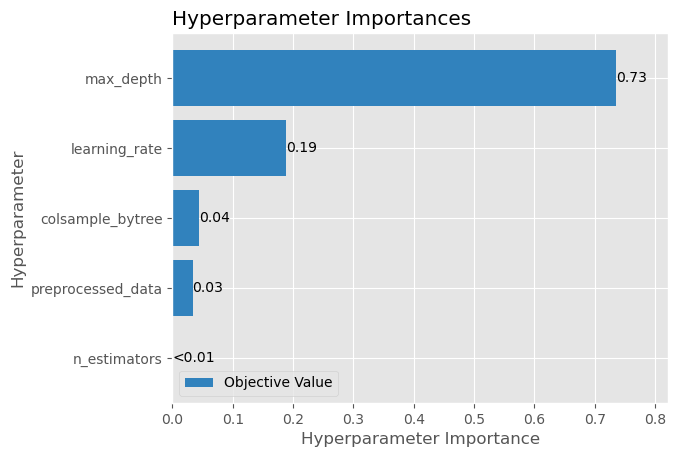

In [40]:
print("Best hyper-parameters for the Gradient Boosted Trees are:")
best_params_str = ["\t\'{key}\': {value}".format(key=key, value=value) 
                   for key, value in xgbreg_study.best_params.items()]
print('\n'.join(best_params_str))

best_model_on_preprocessed_data = xgbreg_study.best_params['preprocessed_data']
model_hyperparams = deepcopy(xgbreg_study.best_params)
del model_hyperparams['preprocessed_data']

best_xgbreg_model = create_xgbreg_model(model_hyperparams)
rmses = {'train': None, 'test': None}
maes = {'train': None, 'test': None}

if best_model_on_preprocessed_data:
    best_xgbreg_model.fit(X=preprocessed_X_train_full,
                          y=preprocessed_y_train_full,
                          verbose=0)
    train_predictions = best_xgbreg_model.predict(preprocessed_X_train_full)
    test_predictions = best_xgbreg_model.predict(preprocessed_X_test)
    rmses['train'] = rmse_with_preprocessed_target(y_train_full, train_predictions)
    rmses['test'] = rmse_with_preprocessed_target(y_test, test_predictions)
    maes['train'] = mean_absolute_error_with_preprocessed_target(y_train_full, train_predictions)
    maes['test'] = mean_absolute_error_with_preprocessed_target(y_test, test_predictions)
else:
    best_xgbreg_model.fit(X=X_train_full,
                          y=y_train_full,
                          verbose=0)
    train_predictions = best_xgbreg_model.predict(X_train_full)
    test_predictions = best_xgbreg_model.predict(X_test)
    rmses['train'] = rmse(y_train_full, train_predictions)
    rmses['test'] = rmse(y_test, test_predictions)
    maes['train'] = mean_absolute_error(y_train_full, train_predictions)
    maes['test'] = mean_absolute_error(y_test, test_predictions)

print("\nThe RMSE for the train split is %5.4f." % rmses['train'])
print("The RMSE for the test split is %5.4f." % rmses['test'])

print("\nThe MAE for the train split is %5.4f." % maes['train'])
print("The MAE for the test split is %5.4f.\n" % maes['test'])

optuna.visualization.matplotlib.plot_param_importances(xgbreg_study)
plt.show()

**Random Forest**

In [41]:
global rfreg_search_space

def rfreg_model_for_trial(trial):
    n_estimators = trial.suggest_categorical('n_estimators', rfreg_search_space['n_estimators'])
    max_depth = trial.suggest_categorical('max_depth', rfreg_search_space['max_depth'])
    max_features = trial.suggest_categorical('max_features', rfreg_search_space['max_features'])
    model = create_rfreg_model({'n_estimators': n_estimators,
                                'max_depth': max_depth,
                                'max_features': max_features})
    return model

def rfreg_objective(trial):
    preprocessed_data = trial.suggest_categorical('preprocessed_data', rfreg_search_space['preprocessed_data'])
    model = rfreg_model_for_trial(trial)
    if preprocessed_data == False:
        model.fit(X=X_train,
                  y=y_train)
        predictions = model.predict(X_val)
        score = mean_absolute_error(y_val, predictions)
    else:
        model.fit(X=preprocessed_X_train,
                  y=preprocessed_y_train)
        predictions = model.predict(preprocessed_X_val)
        score = mean_absolute_error_with_preprocessed_target(y_val, predictions)
    return score

rfreg_search_space = {'n_estimators': [200, 250, 500, 550, 600],
                       'max_depth': [5, 6, 7, 10],
                       'max_features': [0.8, 0.9, 1],
                       'preprocessed_data': [True, False]}
rfreg_sampler = optuna.samplers.GridSampler(rfreg_search_space)
rfreg_study = optuna.create_study(study_name='Random Forest hyper-parameter tuning', direction='minimize', sampler=rfreg_sampler)
rfreg_study.optimize(rfreg_objective, n_jobs=10)

[I 2025-01-29 14:42:24,556] A new study created in memory with name: Random Forest hyper-parameter tuning
[I 2025-01-29 14:42:33,674] Trial 4 finished with value: 3.1107264749802392 and parameters: {'preprocessed_data': True, 'n_estimators': 250, 'max_depth': 5, 'max_features': 0.8}. Best is trial 4 with value: 3.1107264749802392.
[I 2025-01-29 14:42:33,976] Trial 5 finished with value: 3.998587552304775 and parameters: {'preprocessed_data': False, 'n_estimators': 500, 'max_depth': 5, 'max_features': 1}. Best is trial 4 with value: 3.1107264749802392.
[I 2025-01-29 14:42:35,046] Trial 2 finished with value: 3.974993787466525 and parameters: {'preprocessed_data': True, 'n_estimators': 550, 'max_depth': 5, 'max_features': 1}. Best is trial 4 with value: 3.1107264749802392.
[I 2025-01-29 14:42:35,700] Trial 6 finished with value: 2.962566290054067 and parameters: {'preprocessed_data': True, 'n_estimators': 250, 'max_depth': 6, 'max_features': 0.9}. Best is trial 6 with value: 2.9625662900

RandomForestRegressor hyper-parameter study summary

Best hyper-parameters for the Random Forest approach are:
	'preprocessed_data': True
	'n_estimators': 200
	'max_depth': 10
	'max_features': 0.9

The RMSE for the train split is 1.7195.
The RMSE for the test split is 3.3286.

The MAE for the train split is 1.3370.
The MAE for the test split is 2.5105.



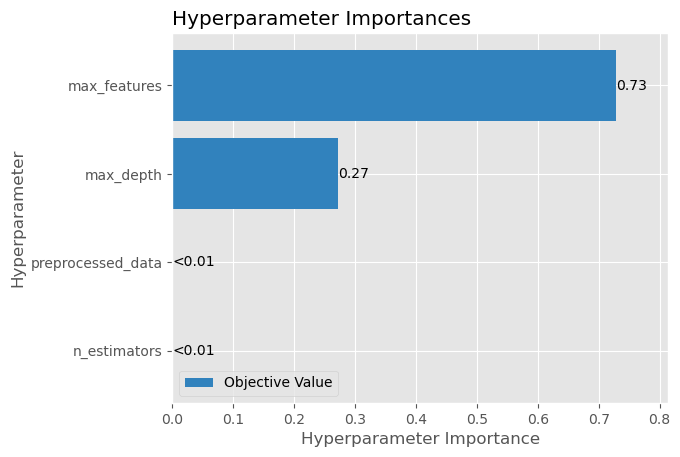

In [42]:
print("Best hyper-parameters for the Random Forest approach are:")
best_params_str = ["\t\'{key}\': {value}".format(key=key, value=value) 
                   for key, value in rfreg_study.best_params.items()]
print('\n'.join(best_params_str))

best_model_on_preprocessed_data = rfreg_study.best_params['preprocessed_data']
model_hyperparams = deepcopy(rfreg_study.best_params)
del model_hyperparams['preprocessed_data']

best_rfreg_model = create_rfreg_model(model_hyperparams)
rmses = {'train': None, 'val': None, 'test': None}
maes = {'train': None, 'test': None}

if best_model_on_preprocessed_data:
    best_rfreg_model.fit(X=preprocessed_X_train_full,
                          y=preprocessed_y_train_full)
    train_predictions = best_rfreg_model.predict(preprocessed_X_train_full)
    test_predictions = best_rfreg_model.predict(preprocessed_X_test)
    rmses['train'] = rmse_with_preprocessed_target(y_train_full, train_predictions)
    rmses['test'] = rmse_with_preprocessed_target(y_test, test_predictions)
    maes['train'] = mean_absolute_error_with_preprocessed_target(y_train_full, train_predictions)
    maes['test'] = mean_absolute_error_with_preprocessed_target(y_test, test_predictions)
else:
    best_rfreg_model.fit(X=X_train_full,
                          y=y_train_full)
    train_predictions = best_rfreg_model.predict(X_train_full)
    test_predictions = best_rfreg_model.predict(X_test)
    rmses['train'] = rmse(y_train_full, train_predictions)
    rmses['test'] = rmse(y_test, test_predictions)
    maes['train'] = mean_absolute_error(y_train_full, train_predictions)
    maes['test'] = mean_absolute_error(y_test, test_predictions)

print("\nThe RMSE for the train split is %5.4f." % rmses['train'])
print("The RMSE for the test split is %5.4f." % rmses['test'])

print("\nThe MAE for the train split is %5.4f." % maes['train'])
print("The MAE for the test split is %5.4f.\n" % maes['test'])

optuna.visualization.matplotlib.plot_param_importances(rfreg_study)
plt.show()

**Decision Tree**

In [43]:
global dtreg_search_space

def dtreg_model_for_trial(trial):
    max_depth = trial.suggest_categorical('max_depth', dtreg_search_space['max_depth'])
    max_features = trial.suggest_categorical('max_features', dtreg_search_space['max_features'])
    model = create_dtreg_model({'max_depth': max_depth,
                                'max_features': max_features})
    return model

def dtreg_objective(trial):
    preprocessed_data = trial.suggest_categorical('preprocessed_data', dtreg_search_space['preprocessed_data'])
    model = dtreg_model_for_trial(trial)
    if preprocessed_data == False:
        model.fit(X=X_train,
                  y=y_train)
        predictions = model.predict(X_val)
        score = mean_absolute_error(y_val, predictions)
    else:
        model.fit(X=preprocessed_X_train,
                  y=preprocessed_y_train)
        predictions = model.predict(preprocessed_X_val)
        score = mean_absolute_error_with_preprocessed_target(y_val, predictions)
    return score

dtreg_search_space = {'max_depth': [5, 6, 7, 10, 11, 12, 13, 14, 15],
                      'max_features': [0.8, 0.9, 1],
                      'preprocessed_data': [True, False]}
dtreg_sampler = optuna.samplers.GridSampler(dtreg_search_space)
dtreg_study = optuna.create_study(study_name='Decision Tree hyper-parameter tuning', direction='minimize', sampler=dtreg_sampler)
dtreg_study.optimize(dtreg_objective, n_jobs=10)

[I 2025-01-29 14:46:18,402] A new study created in memory with name: Decision Tree hyper-parameter tuning
[I 2025-01-29 14:46:18,456] Trial 2 finished with value: 4.873826199076946 and parameters: {'preprocessed_data': True, 'max_depth': 11, 'max_features': 1}. Best is trial 2 with value: 4.873826199076946.
[I 2025-01-29 14:46:18,474] Trial 10 finished with value: 5.202156409660905 and parameters: {'preprocessed_data': False, 'max_depth': 12, 'max_features': 1}. Best is trial 2 with value: 4.873826199076946.
[I 2025-01-29 14:46:18,504] Trial 0 finished with value: 3.5096140085708534 and parameters: {'preprocessed_data': False, 'max_depth': 5, 'max_features': 0.9}. Best is trial 0 with value: 3.5096140085708534.
[I 2025-01-29 14:46:18,524] Trial 3 finished with value: 3.710100638205549 and parameters: {'preprocessed_data': True, 'max_depth': 7, 'max_features': 0.8}. Best is trial 0 with value: 3.5096140085708534.
[I 2025-01-29 14:46:18,566] Trial 8 finished with value: 3.422474783733931

DecisionTreeRegressor hyper-parameter study summary

Best hyper-parameters for the Decision Tree approach are:
	'preprocessed_data': True
	'max_depth': 7
	'max_features': 0.9

The RMSE for the train split is 3.2853.
The RMSE for the test split is 4.2492.

The MAE for the train split is 2.4360.
The MAE for the test split is 3.2396.



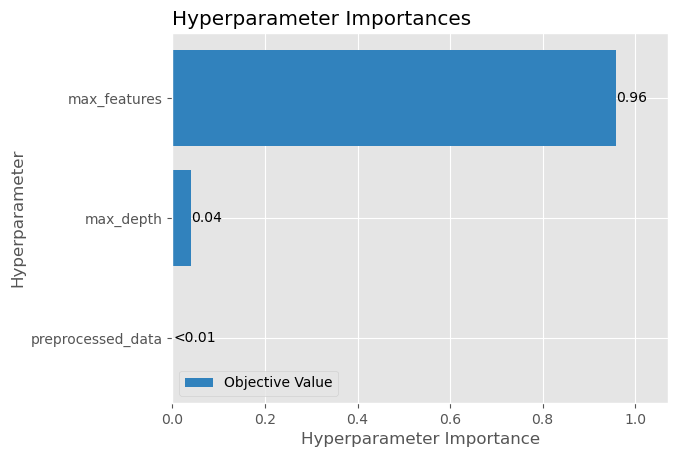

In [44]:
print("Best hyper-parameters for the Decision Tree approach are:")
best_params_str = ["\t\'{key}\': {value}".format(key=key, value=value) 
                   for key, value in dtreg_study.best_params.items()]
print('\n'.join(best_params_str))

best_model_on_preprocessed_data = dtreg_study.best_params['preprocessed_data']
model_hyperparams = deepcopy(dtreg_study.best_params)
del model_hyperparams['preprocessed_data']

best_dtreg_model = create_dtreg_model(model_hyperparams)
rmses = {'train': None, 'val': None, 'test': None}
maes = {'train': None, 'val': None, 'test': None}

if best_model_on_preprocessed_data:
    best_dtreg_model.fit(X=preprocessed_X_train_full,
                          y=preprocessed_y_train_full)
    train_predictions = best_dtreg_model.predict(preprocessed_X_train_full)
    test_predictions = best_dtreg_model.predict(preprocessed_X_test)
    rmses['train'] = rmse_with_preprocessed_target(y_train_full, train_predictions)
    rmses['test'] = rmse_with_preprocessed_target(y_test, test_predictions)
    maes['train'] = mean_absolute_error_with_preprocessed_target(y_train_full, train_predictions)
    maes['test'] = mean_absolute_error_with_preprocessed_target(y_test, test_predictions)
else:
    best_dtreg_model.fit(X=X_train_full,
                          y=y_train_full)
    train_predictions = best_dtreg_model.predict(X_train_full)
    test_predictions = best_dtreg_model.predict(X_test)
    rmses['train'] = rmse(best_dtreg_model, X_train_full, y_train_full)
    rmses['test'] = rmse(best_dtreg_model, X_test, y_test)
    maes['train'] = mean_absolute_error(y_train_full, train_predictions)
    maes['test'] = mean_absolute_error(y_test, test_predictions)

print("\nThe RMSE for the train split is %5.4f." % rmses['train'])
print("The RMSE for the test split is %5.4f." % rmses['test'])

print("\nThe MAE for the train split is %5.4f." % maes['train'])
print("The MAE for the test split is %5.4f.\n" % maes['test'])

optuna.visualization.matplotlib.plot_param_importances(dtreg_study)
plt.show()

**Ridge Regression**

In [46]:
best_rr_model = create_ridgereg_model({'alpha': .8})
best_rr_model.fit(X_train_full, y_train_full)
rmses = {'train': None, 'val': None, 'test': None}
maes = {'train': None, 'test': None}

train_predictions = best_rr_model.predict(X_train_full)
test_predictions = best_rr_model.predict(X_test)
rmses['train'] = rmse(y_train_full, train_predictions)
rmses['test'] = rmse(y_test, test_predictions)
maes['train'] = mean_absolute_error(y_train_full, train_predictions)
maes['test'] = mean_absolute_error(y_test, test_predictions)

print("\nThe RMSE for the train split is %5.4f." % rmses['train'])
print("The RMSE for the test split is %5.4f." % rmses['test'])

print("\nThe MAE for the train split is %5.4f." % maes['train'])
print("The MAE for the test split is %5.4f.\n" % maes['test'])


The RMSE for the train split is 3.8069.
The RMSE for the test split is 3.6603.

The MAE for the train split is 2.9431.
The MAE for the test split is 2.8471.



### **Results summary**

| Model                 | Test RMSE | Test MAE | Train RMSE | Train MAE |
|:----------------------|:----------|:---------|:-----------|:----------|
| XGBRegressor          | 3.0577    | 2.3481   | 0.1562     | 0.1127    |
| RandomForestRegressor | 3.3286    | 2.5105   | 1.7195     | 1.3370    |
| Ridge Regression      | 3.6603    | 2.8471   | 3.8069     | 2.9431    |
| DecisionTreeRegressor | 4.2492    | 3.2396   | 3.2853     | 2.4360    |


**Best hyper-parameters for each model**

**XGBRegressor**: {'preprocessed_data': True, 'n_estimators': 550, 'max_depth': 5, 'learning_rate': 0.1, 'colsample_bytree': 1}

**RandomForestRegressor**: {'preprocessed_data': True, 'n_estimators': 200, 'max_depth': 10, 'max_features': 0.9}

**Ridge Regression**: {'preprocessed_data': False, 'alpha': 0.8}

**DecisionTreeRegressor**: {'preprocessed_data': True, 'max_depth': 7, 'max_features': 0.9}

### **Insights**

**Models performance** *(How do the models perform?)*

The previous table shows the summary of the experimental analysis. While the tree-based models have been trained using either the RMSE or MSE evaluation metrics, the MAE might be a more appropriate metric to discuss whether the application has a good enough performance to address the task. Thus, the table contains both the RMSE and MAE values for both the training and testing splits. In the model selection process during hyper-parameter tuning, the MAE on the test split has been used for model selection. The XGBRegressor achieved the best results with a test MAE of 2.3010, which is not surprising since the XGBRegressor model has state-of-the-art results in multiple regression tasks. The second-best model is the RandomForestRegressor, which achieved an MAE of 2.5140. Probably the most surprising outcome of the XGBRegressor and RandomForestRegressor studies is the fact that the best results have been achieved using standardised data and a relatively small number of estimators - i.e. not the largest values in the hyper-parameter search space. The next best-performing model was the Ridge regressor, which achieved a 2.8471 MAE on the test split, and the worst-performing model was the DecisionTreeRegressor, with an MAE value of 3.1950. For these last two experiments, the most surprising outcome of the studies is the fact that the Ridge regression implementation works best on raw data, while the DecisionTreeRegressor performs best on standardized data. This outcome is unexpected because tree-based models are known not to be affected by data transformations, while the ridge regression is the other way around. This could be an indicator that the "outliers" identified for each feature in the exploratory data analysis might negatively impact the standardization approach used here. Overall, given the range of the target value - i.e. targets represent percentages with values between 0 and 100 - all models have good scores for the MAEs on the test split.


**Models comparative study** *(How does the model's performance compare to a more/less computationally heavy model?)*

When comparing the models from the computational expenses point of view, the differences in performance do not seem extremely significant. More precisely, the differences between the test MAEs for the least expensive models compared to the XGBRegressor are 0.5461 for the Ridge regression model and 0.8940 for the DecisionTreeRegressor model. Taking into account the range of the target values, these differences seem even less significant. Moreover, considering the interpretability levels of these less computationally expensive models, the combined benefits of using these models that do not necessarily perform the best may outweigh the improvements in accuracy that the more resource-intensive models bring.

**Is there any room for improvement? If so, what do you think it is needed? Is training data enough for such an application?**

As in any machine learning application, there is always room for improvement. In this particular case, training the models on more data might further advance the performance of the models. This need for more training data can be indicated by the presence of overfitting in the tree-based models, revealed by the high difference between the error values calculated on both the training and testing splits. When looking at the overfitting levels of each model, it seems that as the performance of the model increases, so does the potential for overfitting. For example, the XGBRegressor has the biggest difference between the MAE values for the train and test split, followed by the RandomForestRegressor and the DecisionTreeRegressor. The fact that the ridge regression model manages to score better values on the test split than on the training one can be surprising, but in the end, that is the role of the penalization term the model uses in its loss formula.

**Do you think the model's performance is enough for the application that you are aiming to address?**

As mentioned before in the model performance assessment section, when considering the range of values the targets can take, the scored MAEs of all models are quite good. In the context of this specific regression task, even an MAE error of 3.1950 (the worst one achieved) is not unacceptable. For instance, the DecisionTreeRegressor model predicts the target percentage with an error margin of approximately 3%, which is not unacceptable. Moreover, considering the relatively small computational costs of implementing a model such as a DecisionTreeRegressor and the high level of interpretability it offers, the model can be seen in an even better light. 


**Is the model scalable to a real-world application?**

The various models that have been implemented have different levels of scalability. On one hand, from a performance point of view, it has been previously stated that all models achieve good results, making them all possible solutions in a real-world application. On the other hand, from the perspective of scalability to larger datasets and computational efficiency, the most interpretable model - i.e. the DecisionTreeRegressor - might not be the best solution due to the sequential manner in which it is constructed. The other tree-based approaches can easily be parallelised and scaled for training computational efficiency since they rely on building multiple trees ([8], [9]).

## Ethical considerations (15%)

Because the dataset should be constructed in an unbiased manner - i.e. census data is collected for the entire population of a country - the presence of bias in the dataset cannot be assessed, as this data is meant to objectively describe the state of the South African population at that time. Thus, the following analysis will focus more on the interpretability of each model, since this is also one of the most important ethical factors in machine learning applications. In the next code cells, interpretability analyses have been carried on all models, focusing on feature importance and visualisations.

Auxiliary functions

In [47]:
def get_processed_importances(raw_imp):
    aggregated_features = ('dw_', 'psa_', 'lan_', 'pg_', 'pw_')
    imp_dict = {}
    for feature, imp in raw_imp.items():
        if feature.startswith(aggregated_features):
            feature_key = feature.split('_')[0]
            previous_entry = imp_dict.get(feature_key, (0, 0))
            imp_dict[feature_key] = (previous_entry[0] + imp, previous_entry[1] + 1)
        else:
            imp_dict[feature] = (imp, 1)
    summed_imp = {k: v[0] for k, v in imp_dict.items()}
    summed_imp = dict(sorted(summed_imp.items(), key=lambda item: item[1], reverse=True))
    avg_imp = {k: v[0] / v[1] for k, v in imp_dict.items()}
    avg_imp = dict(sorted(avg_imp.items(), key=lambda item: item[1], reverse=True))
    return summed_imp, avg_imp

def plot_importances(importances_sum, importances_avg, title):
    fig, ax = plt.subplots(1, 2, figsize=(16, 5))
    ax[0].bar(list(importances_sum.keys()), list(importances_sum.values()))
    ax[0].set_xlabel('Feature')
    ax[0].set_ylabel('Summed importance')
    ax[1].bar(list(importances_avg.keys()), list(importances_avg.values()))
    ax[1].set_xlabel('Feature')
    ax[1].set_ylabel('Averaged importance')
    ax[0].set_xticklabels(list(importances_sum.keys()), rotation=90)
    ax[1].set_xticklabels(list(importances_avg.keys()), rotation=90)
    ax[0].set_title(title + ' (summed)')
    ax[1].set_title(title + ' (averaged)')
    plt.show()

**XGBRegressor interpretability**

In the case of the XGBRegressor, the interpretability of the model comes from the possibility of visualising feature importance. The importance of features can be scored in different ways, but in this analysis, the scoring is computed based on "the number of times a feature is used to split data across all trees"[10] Since this is a high-dimensional dataset, the columns that represent percentages of different responses for the same questions in the census have been aggregated in two ways: by summing and by averaging them, as the importance can be perceived from two different points of view. On one hand, judging by the number of times a question from the census data has been used as a split variable in the training procedure, the most relevant features in the dataset are related to dwelling types, languages, school attendance, population groups, and the total number of households. On the other hand, when these importance values are averaged by the number of available responses to each question, the most important features are related to the total number of households, the average number of individuals in a household, the percentage of households that own cars, the dwelling types, and the longitude of the ward center. Thus, from both of these analyses' points of view, the most influential common features are the dwelling type and the number of households in a ward. Put into perspective, the relevance of these features can be understood or explained when also linked to the correlation matrix plotted in the exploratory data analysis section. For instance, the target value and the total households variable present a negative correlation, which can be interpreted as follows: as the number of total households in a ward increases, the percentage of women-headed households with low income in a ward decreases. Based on the general assumption that in any country the population concentration is higher in more developed areas, this correlation can indicate that wards with an increased number of households could be present in more developed areas of the country, where women can have more financial stability.

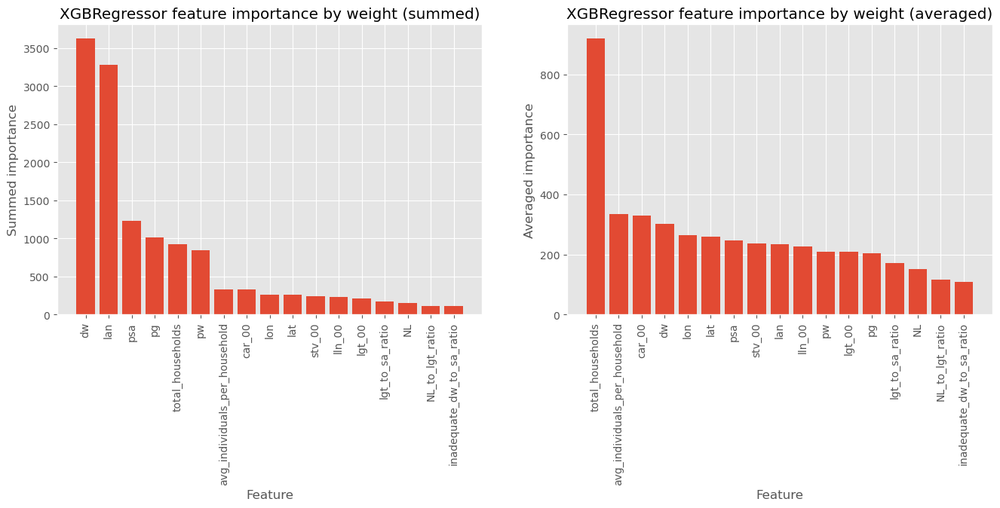

In [92]:
raw_imp = best_xgbreg_model.get_booster().get_score(importance_type='weight')
xgb_weight_summ_imp, xgb_weight_avg_imp = get_processed_importances(raw_imp)
plot_importances(xgb_weight_summ_imp, xgb_weight_avg_imp,
                 'XGBRegressor feature importance by weight')

When switching to a different feature importance score, which is calculated similarly for the RandomForestRegressor and DecisionTreeRegressor, other feature importances arise. From the point of view of the aggregated informance gain a feature adds when it used as a splitting criteria in the ensemble of trees, the most important features are related to school attendance, car ownership, and accessibility to piped water. The potential interpretation of the importance of these features and their correlation to the target variable is discussed in the interpretability analysis for the RandomForestRegressor.

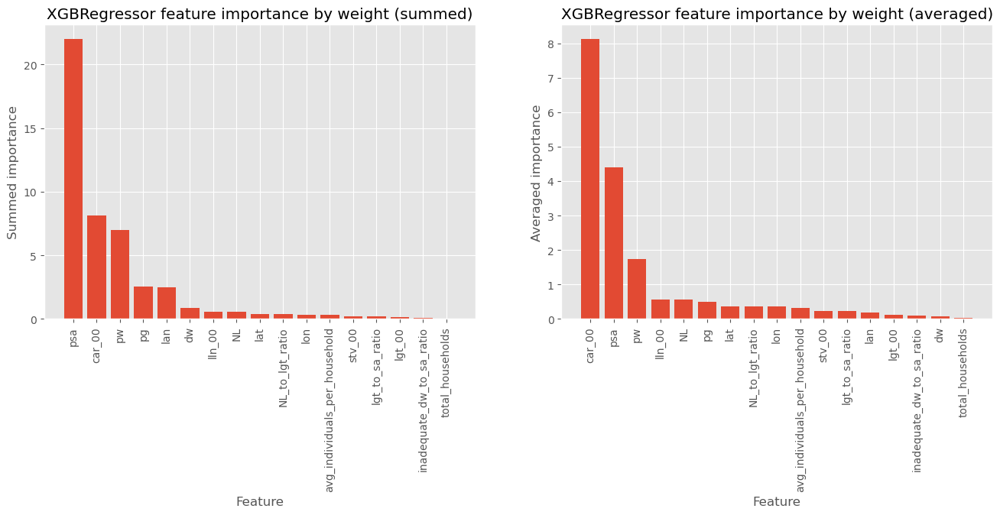

In [91]:
raw_imp = best_xgbreg_model.get_booster().get_score(importance_type='gain')
xgb_weight_summ_imp, xgb_weight_avg_imp = get_processed_importances(raw_imp)
plot_importances(xgb_weight_summ_imp, xgb_weight_avg_imp,
                 'XGBRegressor feature importance by weight')

Moreover, the next code cell demonstrates that each tree in the XGBRegressor ensemble can be visualised. This could help with explaining the fitting and predicting processes of the model, but the relevance for interpretability is not as obvious as it is in the previous interpretability analysis of the XGBRegressor. 

*Note: In a notebook, the output image of the tree is scrollable horizonatlly. While the image can appear extremely zoomed out in the PDF export, it is oh high quality. Thus, by zooming in the nodes can clearly be observed.*

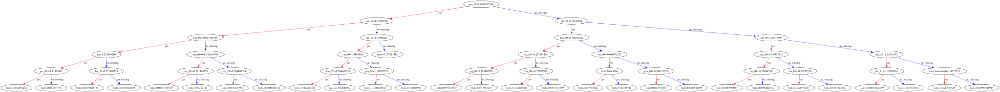

In [81]:
best_xgbreg_model.get_params()['n_estimators']
to_graphviz(best_xgbreg_model, num_trees=0)

**RandomForestRegressor interpretability**

In the case of the RandomForestRegressor, a similar way of assessing the feature importance is available. For this model, the feature importance is "computed as the (normalized) total reduction of the criterion brought by that feature" [11]. The feature importance has been aggregated in a similar way to the XGBRegressor. The most influential common features in this case are related to school attendance, car ownership, and accessibility to piped water questions. Similarly, the importance of the car ownership feature can be linked to the target using the correlation matrix. The matrix reveals a quite strong negative correlation, which can be described as follows: as the prevalence of car ownership in a ward increases, the percentage of women-headed households with low income in the same ward decreases. Based on the assumption that a high prevalence of car ownership can be an indicator of a more prosperous ward in which independent households can be more financially stable, a connection with the  decrease in the number of women-headed households that have a low standard of living can be seen. Because the importance of the other influential features is aggregated, the correlation between these features and the target value cannot be interpreted in depth. However, a potential conceptual link between these indicators and the target can be observed. For instance, high piped water accessibility in a ward can be an indicator of an increased standard of living, thus reducing the prevalence of low-income households and, consequently, low-income women-headed households. Furthermore, knowing the importance of these features in the model, for a more in depth investigation and a better understanding of these relationships, it might be worth analysing the unaggregated importance plot.

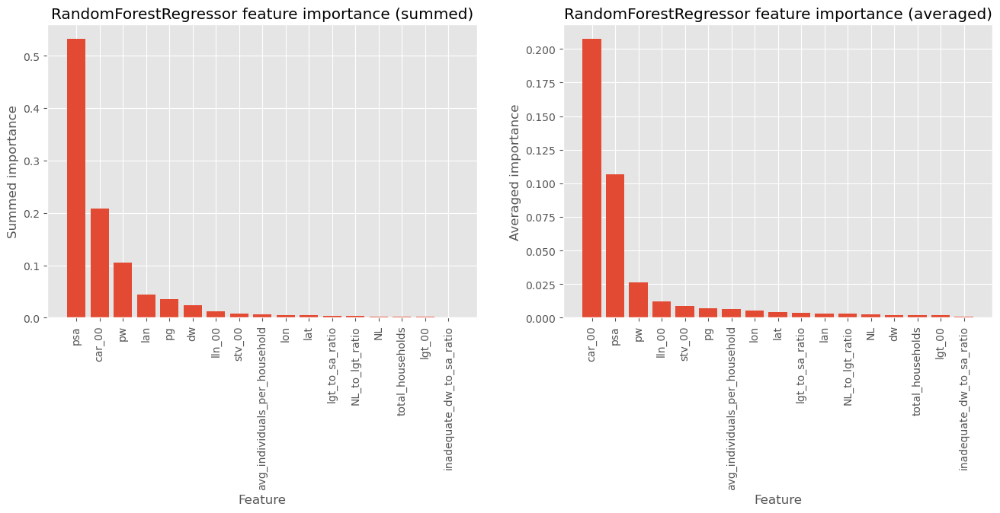

In [82]:
raw_imp = dict(zip(best_rfreg_model.feature_names_in_, best_rfreg_model.feature_importances_))
rf_summ_imp, rf_avg_imp = get_processed_importances(raw_imp)
plot_importances(rf_summ_imp, rf_avg_imp,
                 'RandomForestRegressor feature importance')

**Ridge Regression interpretability**

For the Ridge regression model, interpretability is also assessed using feature importance. In this case, the importance of features has been computed using the standardised regression coefficients [12]. The aggregated feature importance has been computed using the absolute values of the standardised regression coefficients, using a similar method as for the previous models. Similar to the random forest approach, in the Ridge regression model, the most important features are related to school attendance and car ownership. The potential interpretation of the importance of these features and their correlation to the target variable has been discussed for the previous model.

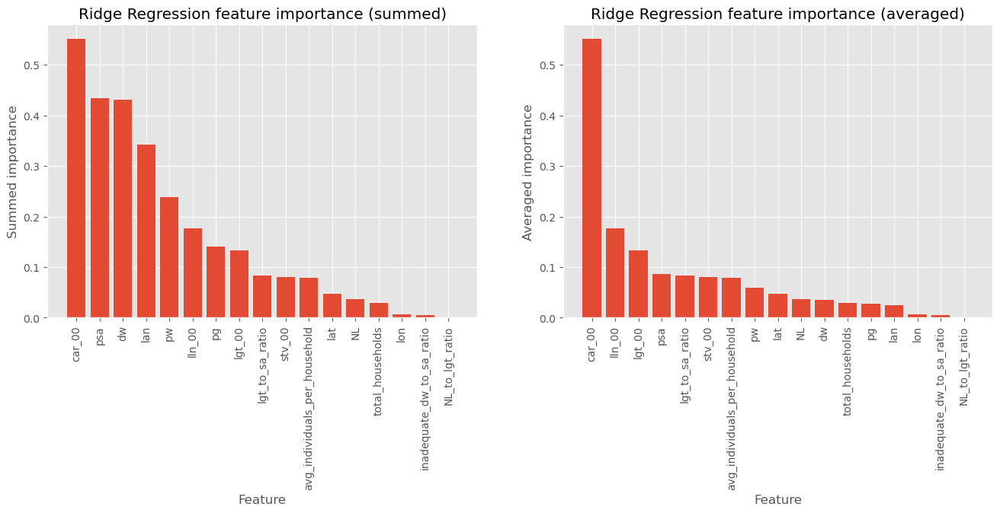

In [90]:
feature_coeff = dict(zip(list(best_rr_model.feature_names_in_), best_rr_model.coef_.tolist()))
standardized_feature_coeff = {}

for feature, coeff in feature_coeff.items():
    standardized_feature_coeff[feature] = feature_coeff[feature] * np.std(X_train[feature]) / np.std(y_train)

standardized_feature_coeff = dict(sorted(standardized_feature_coeff.items(), key=lambda item: np.abs(item[1]), reverse=True))
absolute_standardized_feature_coeff = {feature: np.abs(coeff) for feature, coeff in standardized_feature_coeff.items()}
rr_summ_coeff, rr_avg_coeff = get_processed_importances(absolute_standardized_feature_coeff)
plot_importances(rr_summ_coeff, rr_avg_coeff,
                 'Ridge Regression feature importance')

**DecisionTreeRegressor interpretability**

For the DecisionTreeRegressor, the feature importance is computed in the same way as it is computed for the RandomForestRegressor, and the aggregated importance is calculated identically. The most influential common features between the two plots are related to school attendance, car ownership, and satellite TV ownership. Similar to the importance of car ownership, the satellite TV feature can be linked to the target using the correlation matrix, which reveals a negative correlation. Based on the fact that both cars and satellite TV subscriptions are non-basic needs, a high prevalence of satellite TV in a ward can be interpreted as an indicator of a more prosperous ward with more financially stable households, resulting in a decrease in the prevalence of low-income households. Consequently, this decreases the number of women-headed households that have a low standard of living.

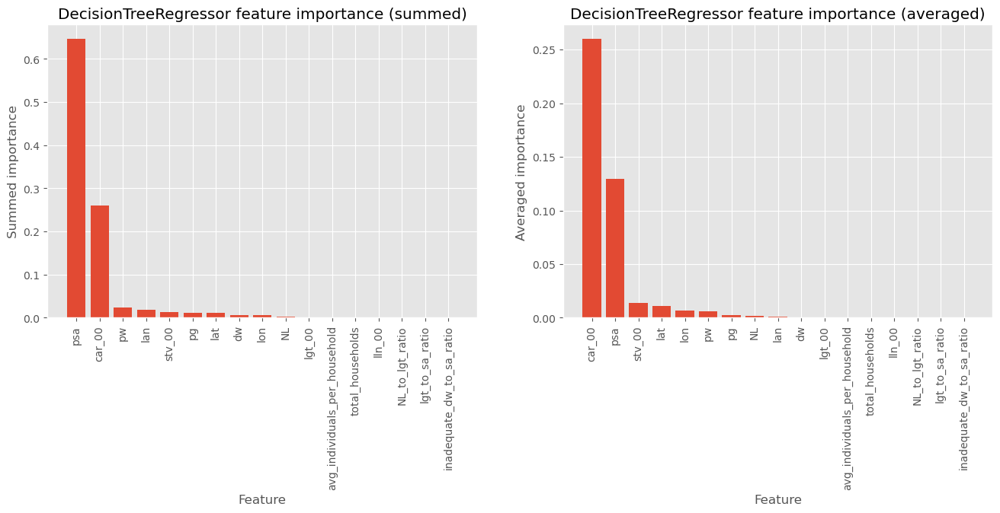

In [88]:
raw_imp = dict(zip(best_dtreg_model.feature_names_in_, best_dtreg_model.feature_importances_))
dt_summ_imp, dt_avg_imp = get_processed_importances(raw_imp)
plot_importances(dt_summ_imp, dt_avg_imp,
                 'DecisionTreeRegressor feature importance')

**DecisionTreeRegressor plot**

Furthermore, the possibility of following the decision process of the DecisionTreeRegressor adds to its interpretability. The following code cell plots the best decision tree found in the emoirical analysis.

*Note: In a notebook, the output image of the tree is scrollable horizonatlly. While the image can appear extremely zoomed out in the PDF export, it is oh high quality. Thus, by zooming in the nodes can clearly be observed.*

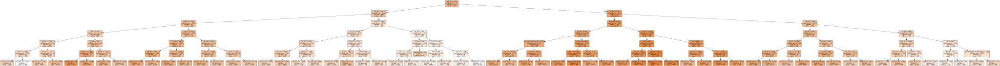

In [84]:
dot_data = tree.export_graphviz(best_dtreg_model, 
                                feature_names=list(X_train.columns),  
                                filled=True)
graph = graphviz.Source(dot_data)
graph

Overall, when comparing the interpretability analyses of all models, some feature importance patterns emerge. More specifically, in all analyses, the features related to car ownership and school attendance turned out to be of high importance. The next most commonly significant feature is related to accessibility to piped water.

## Sustainable development relevance & impact (15%)

**What are the current challenges surrounding this dataset in terms of sustainable development and how can ML help overcome them? How could the model impact our progress towards achieving the sustainable development goals?**

As discussed before, the key indicators in the dataset aim to capture multiple facets of South African society across different geopolitical subspaces in the country, and many of them can establish connections to multiple Sustainable Development Goals. Firstly, the dataset includes statistics related to different types of accessibility to piped water, an indicator which can capture the different levels of achievement of the sixth SDG ("Clean water and sanitation") in a South African ward. Indicators such as the "pw" features in the dataset can be particularly linked to the first and second targets of the sixth SDG, targets which aim to provide "universal and equitable access to safe and affordable drinking water"[13] and "access to adequate and equitable hygiene for all"[13]. There is no doubt that by providing universal affordable access to piped water across all subspaces of a country, steps are made towards the improvement of these targets and, consequently, the sixth SDG. Secondly, the school attendance indicators which have proven to be of high importance in the interpretability analysis done before can be linked to the fourth SDG ("Quality education"). The "psa" indicators aim to reveal the percentages of people in a ward who should be studying and assess their school attendance. These indicators can be relevant to the first and third targets of the fourth SDG, as these targets aim to increase the number of people who complete primary, secondary, vocational, and tertiary education[13]. Moreover, as mentioned before, when looking at the bigger picture, the dataset contains certain indicators that quantify the prevalence of certain "privileged" goods, such as satellite TV or cars, while at the same time revealing the presence of certain gaps in basic needs for people who live in the same region. This dualism of life standards that is brought to light also relates this dataset to the tenth SDG ("Reduce inequality").

As for the implemented model itself, its main purpose is to offer accurate estimates of the percentage of women-headed households in South African wards with low income. This type of model can predict statistics that are relevant to the first ("No poverty") and fifth ("Gender equality") SDGs. It can help policymakers assess the achievement of these goals using only responses to a few objective questions that any resident of a country can answer quickly. Moreover, when combined with an interpretability analysis, any of the proposed models can also provide insights into the interconnections between different societal aspects that can have both positive and negative effects on the studied target. These connections between key indicators related to different SDGs not only reveal the complexity of Sustainable Development, but also help uncover underlying core aspects that may cause or worsen different SD problems. Specifically, the links between features such as school attendance or accessibility to piped water and the target can help key decision-makers by suggesting possible solutions to the aforementioned problems. For instance, given the relationship between piped water access and the percentage of women-headed households experiencing increased poverty, improving piped water accessibility could help alleviate the poverty problem. Similarly, addressing the issue of women-headed household poverty could potentially contribute to increased school attendance. From a technical standpoint, we can make educated guesses about what these correlations reveal. Such interpretable and accurate models can provide concrete evidence of the connections between different problems a country is facing.  When combined with the in-depth knowledge of policymakers regarding various societal challenges, these models can help drive real change, contribute to Sustainable Development, and assess the efficacy of different courses of action that have been tried by policymakers.


**What are the challenges of deploying such a model?**

This solution offers multiple possible models that can help solve this task. For more performant solutions, such as gradient boosted trees or random forest, their interpretability may be less reliable compared to less performant solutions, such as decision trees or ridge regression. These differences in interpretability arise from the fact that ensemble models do not have as straightforward a decision process as the other solutions. Thus, from this point of view, the main challenge with the most performant solutions is their less intuitive interpretability analysis. On the other hand, solutions like decision trees or ridge regression are not as scalable as the more advanced solutions. In a scenario where the dataset's size significantly increases, the fitting process for ensemble models, such as gradient boosted trees and random forests, can be easily parallelised as the training involves fitting multiple weak learners, a process that can be done in parallel. However, more performant models are more computationally expensive, resulting in a larger carbon footprint compared to the less accurate but simpler models. If such a model needs to be trained on a much larger amount of data, its use might act as an inhibitor to the thirteenth SDG ("Climate action") due to its increased carbon footprint. All in all, in the context of tasks addressing Sustainable Development, there are always multiple trade-offs - i.e. between interpretability and accuracy, interpretability and scalability, and accuracy and sustainability. Thus, when choosing an ML model that could help Sustainable Development, it is important to address these trade-offs and analyze them in that specific context. For instance, in the context of this small dataset, even a gradient boosted trees solution does not use as many computational resources. However, when considering the problem we are trying to address, a less accurate but more interpretable approach will have a greater impact, as it gives some guidelines for possible solutions.

### **References**

[1] J. Kamińska, "8 types of data bias that can wreck your machine learning models," Statice, May 2022. Available at: https://www.statice.ai/post/data-bias-types. Accessed 11 December 2023

[2] "The Box-Cox and Yeo-Johnson transformations for continuous variables", Statistical Odds & Ends, February 2021, Available at: https://statisticaloddsandends.wordpress.com/2021/02/19/the-box-cox-and-yeo-johnson-transformations-for-continuous-variables/. Accessed 11 December 2023

[3] R. Shwartz-Ziv and A. Armon, “Tabular data: Deep learning is not all you need,” Information
Fusion, vol. 81, pp. 84–90, 2022, issn: 1566-2535. doi: https://doi.org/10.1016/j.inffus.2021.11.011. Available: https://www.sciencedirect.com/science/article/pii/S1566253521002360.

[4] L. Grinsztajn, E. Oyallon, and G. Varoquaux, “Why do tree-based models still outperform deep
learning on typical tabular data?” Advances in Neural Information Processing Systems, vol. 35,
pp. 507–520, 2022.

[5] Sabine N van der Veer, Lisa Riste, Sudeh Cheraghi-Sohi, Denham L Phipps, Mary P Tully, Kyle Bozentko, Sarah Atwood, Alex Hubbard, Carl Wiper, Malcolm Oswald, Niels Peek, "Trading off accuracy and explainability in AI decision-making: findings from 2 citizens’ juries", Journal of the American Medical Informatics Association, Volume 28, Issue 10, October 2021, Pages 2128–2138, https://doi.org/10.1093/jamia/ocab127

[6] "Overfitting, regularization, and early stopping", Available: https://developers.google.com/machine-learning/decision-forests/overfitting-gbdt. Accessed 11 December 2023

[7] T. Akiba, S. Sano, T. Yanase, T. Ohta, and M. Koyama, “Optuna: A next-generation hyper-
parameter optimization framework,” in Proceedings of the 25th ACM SIGKDD international
conference on knowledge discovery & data mining, 2019, pp. 2623–2631. Available: https://arxiv.org/abs/1907.10902

[8] T. Sadasue, T. Tanaka, R. Kasahara, A. Darmawan, and T. Isshiki, “Scalable hardware architecture for fast gradient boosted tree training,” IPSJ Transactions on System and LSI Design
Methodology, vol. 14, pp. 11–20, 2021. Available: https://www.jstage.jst.go.jp/article/ipsjtsldm/14/0/14_11/_pdf


[9] J. Chen et al., “A parallel random forest algorithm for big data in a spark cloud computing
environment,” IEEE Transactions on Parallel and Distributed Systems, vol. 28, no. 4, pp. 919–
933, 2016. Available: https://arxiv.org/pdf/1810.07748.pdf

[10] "Python api reference - xgboost 2.0.2 documentation". [Online]. Available: https://xgboost.readthedocs.io/en/stable/python/python_api.html. Accessed 11 December 2023

[11] "sklearn.ensemble.RandomForestRegressor documentation". [Online]. Available: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html#sklearn.ensemble.RandomForestRegressor. Accessed 11 December 2023

[12] Manu Joseph, "Explainability: Cracking open the black box, Part 1". [Online]. Available: https://www.kdnuggets.com/2019/12/explainability-black-box-part1.html. Accessed 11 December 2023

[13] United Nations, Department of Economic and Social Affairs - Sustainable Development, Trans-
forming our world: The 2030 agenda for sustainable development, General Assembly, 2015. [On-
line]. Available: https://sustainabledevelopment.un.org/content/documents/21252030%20Agenda%20for%20Sustainable%20Development%20web.pdf. Accessed 11 December 2023